https://towardsdatascience.com/explaining-k-means-clustering-5298dc47bad6

In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
import plotly.offline as pyo
pyo.init_notebook_mode()
import plotly.graph_objs as go
from plotly import tools
from plotly.subplots import make_subplots
import plotly.offline as py
import plotly.express as px
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.metrics import silhouette_score
%matplotlib inline
from warnings import filterwarnings
filterwarnings('ignore')

In [7]:
df_original = pd.read_csv(r'C:\Users\MJAR0016\Desktop\DATA.csv')
df_original.head()

,Unnamed: 0,Type,Openface_gaze_child,Fer_emotions_child,hand_left_x_adult,hand_left_y_adult,hand_right_x_adult,hand_right_y_adult,head_x_adult,head_y_adult,...,hand_right_x_child,hand_right_y_child,head_x_child,head_y_child,Total_video_red_head,Total_video_red_body,Th_lead_red_head,Pat_lead_red_head,Th_lead_red_body,Pat_lead_red_body
0,1,Control,0.367,0.001799,0.127726,0.048561,0.122745,0.050315,0.099885,0.034279,...,0.082856,0.097622,0.182887,0.057123,0.0000,0.000000,0.0,0.000000,0.000000,0.000000
1,2,Control,0.374,0.203160,0.247773,0.211057,0.218768,0.214073,0.198482,0.149894,...,0.037262,0.029972,0.048221,0.026176,0.0000,0.009877,0.0,0.000000,0.000000,0.019677
2,3,Control,0.485,0.007679,0.149614,0.108114,0.176780,0.087354,0.124731,0.054382,...,0.054481,0.105798,0.130008,0.073737,0.0048,0.019200,0.0,0.009562,0.022489,0.015936
3,4,Control,0.377,0.002789,0.067173,0.034553,0.072553,0.032087,0.062592,0.033870,...,0.088655,0.070538,0.116464,0.054508,0.0000,0.000000,0.0,0.000000,0.000000,0.000000
4,5,Control,0.329,0.022569,0.215708,0.257767,0.234966,0.258505,0.185188,0.198978,...,0.095717,0.149772,0.166600,0.102052,0.0000,0.000000,0.0,0.000000,0.000000,0.000000


In [8]:
df = df_original.iloc[2:22,2:22]
df.head()

,Openface_gaze_child,Fer_emotions_child,hand_left_x_adult,hand_left_y_adult,hand_right_x_adult,hand_right_y_adult,head_x_adult,head_y_adult,hand_left_x_child,hand_left_y_child,hand_right_x_child,hand_right_y_child,head_x_child,head_y_child,Total_video_red_head,Total_video_red_body,Th_lead_red_head,Pat_lead_red_head,Th_lead_red_body,Pat_lead_red_body
2,0.485,0.007679,0.149614,0.108114,0.176780,0.087354,0.124731,0.054382,0.153328,0.101382,0.054481,0.105798,0.130008,0.073737,0.00480,0.019200,0.000000,0.009562,0.022489,0.015936
3,0.377,0.002789,0.067173,0.034553,0.072553,0.032087,0.062592,0.033870,0.115682,0.067241,0.088655,0.070538,0.116464,0.054508,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000
4,0.329,0.022569,0.215708,0.257767,0.234966,0.258505,0.185188,0.198978,0.197849,0.152850,0.095717,0.149772,0.166600,0.102052,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000
5,0.126,0.017298,0.254321,0.137887,0.279376,0.129771,0.191501,0.097130,0.138887,0.064735,0.116654,0.065746,0.128286,0.056265,0.00000,0.028385,0.000000,0.000000,0.040712,0.016155
6,0.391,0.244881,0.223700,0.256117,0.250655,0.247896,0.178263,0.207833,0.110339,0.018701,0.045354,0.018782,0.087884,0.018023,0.01494,0.056441,0.003333,0.026455,0.030000,0.082670


In [9]:
with open(r'C:\Users\MJAR0016\Desktop\data\2092-BDH\2092-BDH.csv') as f:
    df =  pd.read_csv(f, usecols=['Patient_emotion', 'Patient_head', 'Therapist_head'])
f.close()
df.head(10)

FileNotFoundError: [Errno 2] No such file or directory: 'C:\\Users\\MJAR0016\\Desktop\\data\\2092-BDH\\2092-BDH.csv'

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16 entries, 2 to 17
Data columns (total 20 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Openface_gaze_child   16 non-null     float64
 1   Fer_emotions_child    16 non-null     float64
 2   hand_left_x_adult     16 non-null     float64
 3   hand_left_y_adult     16 non-null     float64
 4   hand_right_x_adult    16 non-null     float64
 5   hand_right_y_adult    16 non-null     float64
 6   head_x_adult          16 non-null     float64
 7   head_y_adult          16 non-null     float64
 8   hand_left_x_child     16 non-null     float64
 9   hand_left_y_child     16 non-null     float64
 10  hand_right_x_child    16 non-null     float64
 11  hand_right_y_child    16 non-null     float64
 12  head_x_child          16 non-null     float64
 13  head_y_child          16 non-null     float64
 14  Total_video_red_head  16 non-null     float64
 15  Total_video_red_body  16 

#### the standardization of data will bring all features to the same scale and bringing the mean to zero and the standard deviation to 1

In [11]:
scaler = StandardScaler()
scaler.fit(df)
X_scale = scaler.transform(df)
df_scale = pd.DataFrame(X_scale, columns=df.columns)
df_scale.head()

,Openface_gaze_child,Fer_emotions_child,hand_left_x_adult,hand_left_y_adult,hand_right_x_adult,hand_right_y_adult,head_x_adult,head_y_adult,hand_left_x_child,hand_left_y_child,hand_right_x_child,hand_right_y_child,head_x_child,head_y_child,Total_video_red_head,Total_video_red_body,Th_lead_red_head,Pat_lead_red_head,Th_lead_red_body,Pat_lead_red_body
0,0.402894,-0.763041,0.167832,0.298730,0.231729,0.053912,0.200734,-0.417728,0.856321,1.414809,-0.614636,1.530662,0.442713,1.285302,-0.595018,-0.459069,-0.607166,-0.349256,-0.358772,-0.361040
1,0.018253,-0.796289,-0.968547,-0.652925,-0.905850,-0.677385,-0.980839,-0.789755,0.125633,0.541275,0.089620,0.612920,0.169439,0.588498,-0.856797,-0.872032,-0.607166,-0.686864,-0.625421,-0.820492
2,-0.152699,-0.661803,1.078889,2.234786,0.866794,2.318580,1.350312,2.204911,1.720447,2.731664,0.235169,2.675231,1.181050,2.311348,-0.856797,-0.872032,-0.607166,-0.686864,-0.625421,-0.820492
3,-0.875682,-0.697641,1.611126,0.683903,1.351507,0.615170,1.470365,0.357633,0.576044,0.477169,0.666635,0.488185,0.407975,0.652176,-0.856797,-0.261511,-0.607166,-0.686864,-0.142705,-0.354726
4,0.068114,0.849708,1.189041,2.213442,1.038029,2.178195,1.218651,2.365521,0.021933,-0.700642,-0.802741,-0.734198,-0.407233,-0.733588,-0.042011,0.341928,-0.437562,0.247188,-0.269716,1.562974


### elbow method on original scaled dataset

Text(0, 0.5, 'Inertia')

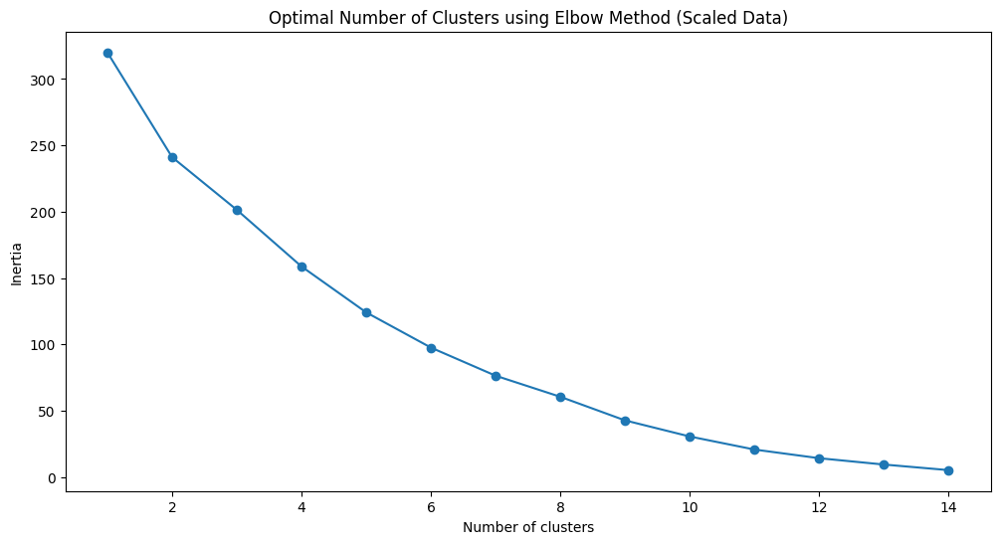

In [12]:
sse = []
k_list = range(1, 15)
for k in k_list:
    km = KMeans(n_clusters=k)
    km.fit(df_scale)
    sse.append([k, km.inertia_])
    
oca_results_scale = pd.DataFrame({'Cluster': range(1,15), 'SSE': sse})
plt.figure(figsize=(12,6))
plt.plot(pd.DataFrame(sse)[0], pd.DataFrame(sse)[1], marker='o')
plt.title('Optimal Number of Clusters using Elbow Method (Scaled Data)')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')

In [13]:
df_scale2 = df_scale.copy()
kmeans_scale = KMeans(n_clusters=2, n_init=100, max_iter=400, init='k-means++', random_state=42).fit(df_scale2)
print('KMeans Scaled Silhouette Score: {}'.format(silhouette_score(df_scale2, kmeans_scale.labels_, metric='euclidean')))
labels_scale = kmeans_scale.labels_
clusters_scale = pd.concat([df_scale2, pd.DataFrame({'cluster_scaled':labels_scale})], axis=1)

KMeans Scaled Silhouette Score: 0.16317934859355496


In [32]:
df_scale2 = df_scale.copy()
kmeans_scale = KMeans(n_clusters=2, n_init=100, max_iter=400, init='k-means++', random_state=42).fit(df_scale2)
print('KMeans Scaled Silhouette Score: {}'.format(silhouette_score(df_scale2, kmeans_scale.labels_, metric='euclidean')))
labels_scale = kmeans_scale.labels_
clusters_scale = pd.concat([df_scale2, pd.DataFrame({'cluster_scaled':labels_scale})], axis=1)

KMeans Scaled Silhouette Score: 0.16317934859355496


- KMeans on the original dataset - 5 clusters.
- silhouette score of 0.444 which is on the low end.

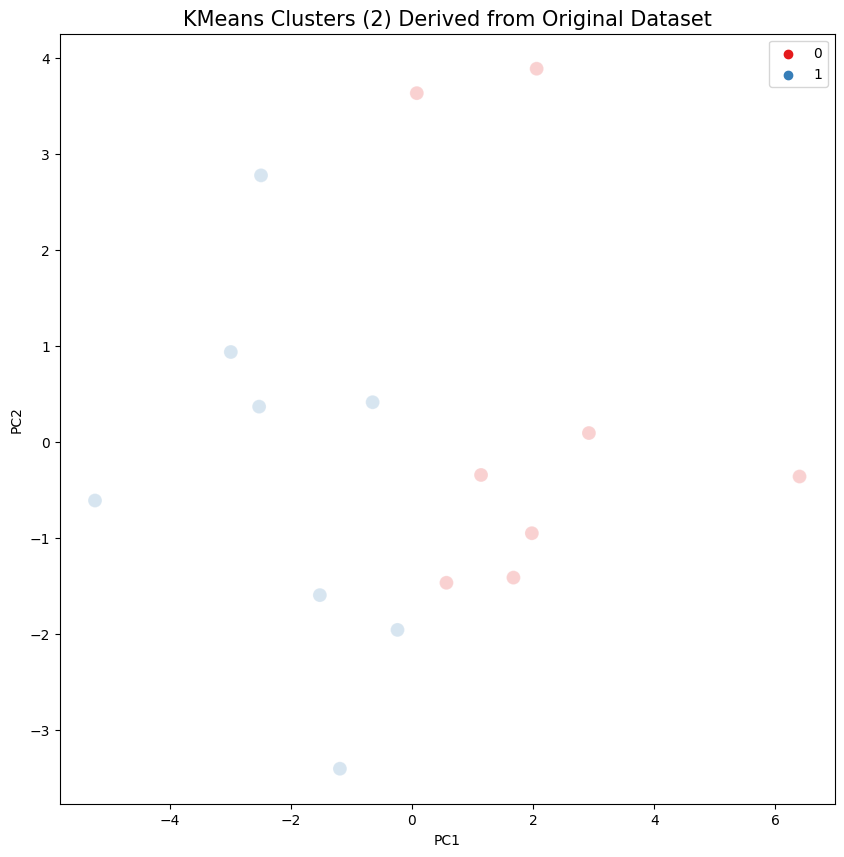

In [14]:
pca2 = PCA(n_components=2).fit(df_scale2)
pca2d = pca2.transform(df_scale2)
plt.figure(figsize = (10,10))
sns.scatterplot(x=pca2d[:,0], y=pca2d[:,1],
                hue=labels_scale, 
                palette='Set1',
                s=100, alpha=0.2).set_title('KMeans Clusters (2) Derived from Original Dataset', fontsize=15)
plt.legend()
plt.ylabel('PC2')
plt.xlabel('PC1')
plt.show()

In [35]:
Scene = dict(xaxis = dict(title  = 'PC1'),yaxis = dict(title  = 'PC2'),zaxis = dict(title  = 'PC3'))
labels = labels_scale
trace = go.Scatter3d(x=pca2d[:,0], y=pca2d[:,1], z=pca2d[:,2], mode='markers',marker=dict(color = labels, colorscale='Viridis', size = 10, line = dict(color = 'gray',width = 5)))
layout = go.Layout(margin=dict(l=0,r=0),scene = Scene, height = 1000,width = 1000)
data = [trace]
fig = go.Figure(data = data, layout = layout)
fig.show()

IndexError: index 2 is out of bounds for axis 1 with size 2

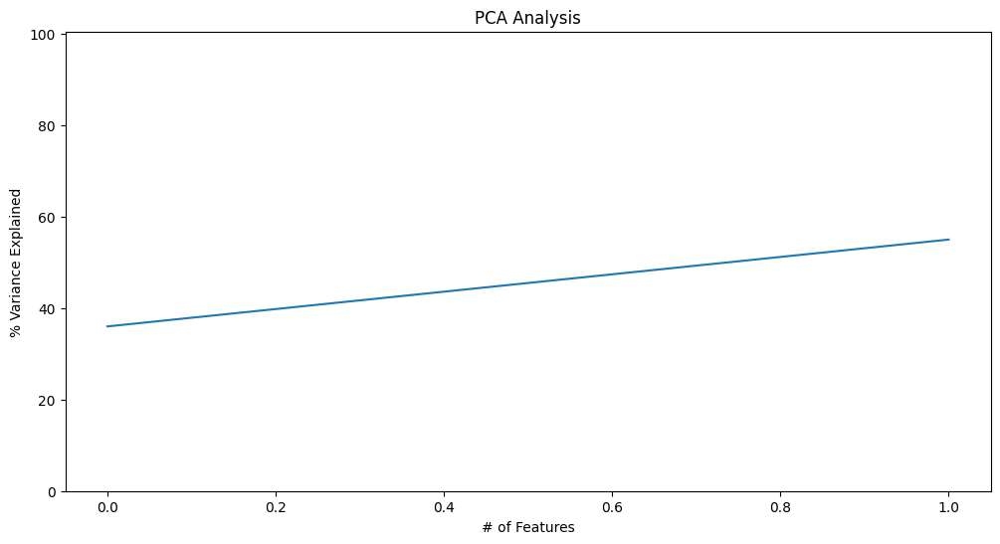

In [15]:
# 3 features in dataset
pca = PCA(n_components=2)
pca.fit(df_scale)
variance = pca.explained_variance_ratio_
var = np.cumsum(np.round(variance, 2)*100)
plt.figure(figsize=(12,6))
plt.ylabel('% Variance Explained')
plt.xlabel('# of Features')
plt.title('PCA Analysis')
plt.ylim(0,100.5)
plt.plot(var)

In [16]:
pca = PCA(n_components=2)
pca_scale = pca.fit_transform(df_scale)
pca_df_scale = pd.DataFrame(pca_scale, columns=['pc1','pc2'])
print("Pca explained varaince ratio",pca.explained_variance_ratio_)

Pca explained varaince ratio [0.35991225 0.19002117]


Text(0, 0.5, 'Inertia')

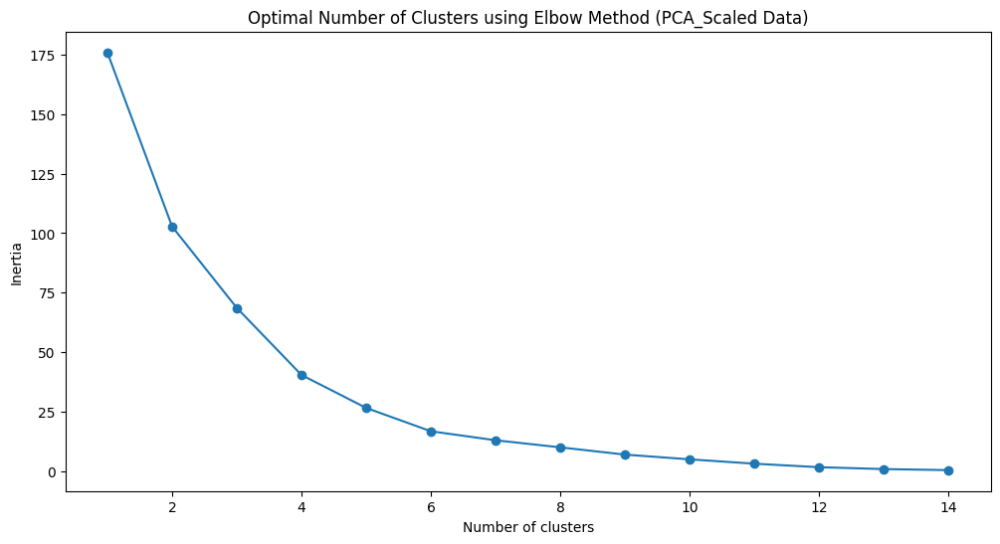

In [17]:
sse = []
k_list = range(1, 15)
for k in k_list:
    km = KMeans(n_clusters=k)
    
    km.fit(pca_df_scale)
    sse.append([k, km.inertia_])
    
pca_results_scale = pd.DataFrame({'Cluster': range(1,15), 'SSE': sse})
plt.figure(figsize=(12,6))
plt.plot(pd.DataFrame(sse)[0], pd.DataFrame(sse)[1], marker='o')
plt.title('Optimal Number of Clusters using Elbow Method (PCA_Scaled Data)')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')

In [18]:
kmeans_pca_scale = KMeans(n_clusters=2, n_init=100, max_iter=400, init='k-means++', random_state=42).fit(pca_df_scale)
print('KMeans PCA Scaled Silhouette Score: {}'.format(silhouette_score(pca_df_scale, kmeans_pca_scale.labels_, metric='euclidean')))
labels_pca_scale = kmeans_pca_scale.labels_
clusters_pca_scale = pd.concat([pca_df_scale, pd.DataFrame({'pca_clusters':labels_pca_scale})], axis=1)

KMeans PCA Scaled Silhouette Score: 0.30767860537532044


In [22]:
label = kmeans_pca_scale.fit_predict(pca_scale)
print(label)

[1 0 1 1 1 0 0 1 0 0 1 0 0 0 1 1]


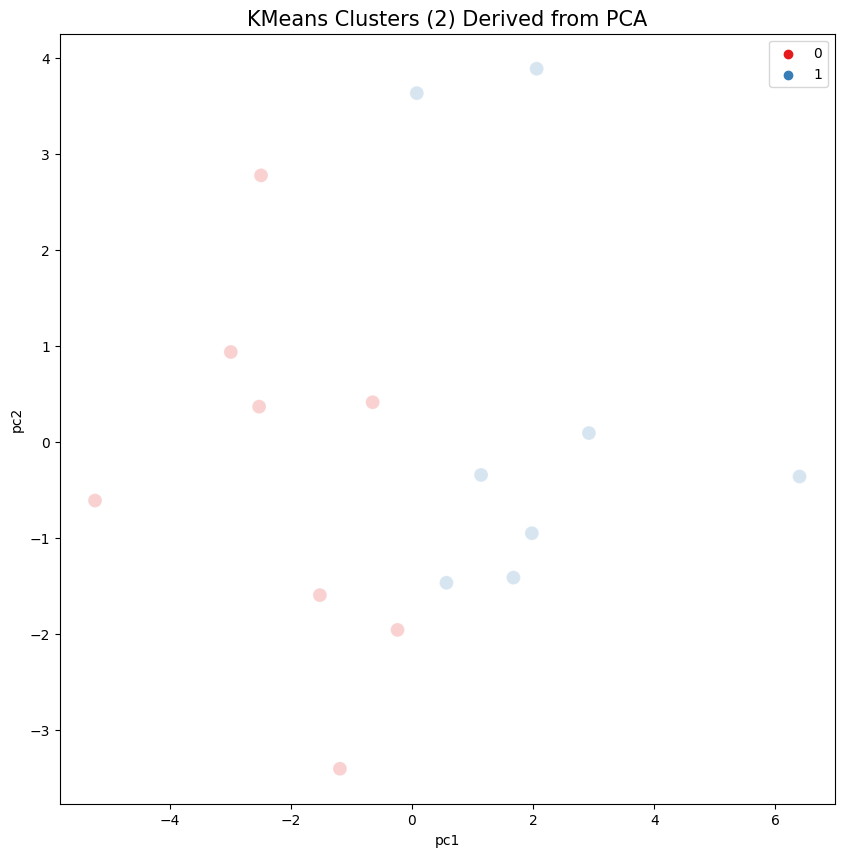

In [42]:
plt.figure(figsize = (10,10))
sns.scatterplot(x=clusters_pca_scale.iloc[:,0],y=clusters_pca_scale.iloc[:,1], hue=labels_pca_scale, palette='Set1', s=100, alpha=0.2).set_title('KMeans Clusters (2) Derived from PCA', fontsize=15)
plt.legend()
plt.show()

### Feature Reduction via t-SNE

[t-SNE] Computing 15 nearest neighbors...
[t-SNE] Indexed 16 samples in 0.000s...
[t-SNE] Computed neighbors for 16 samples in 0.005s...
[t-SNE] Computed conditional probabilities for sample 16 / 16
[t-SNE] Mean sigma: 6.510681
[t-SNE] KL divergence after 250 iterations with early exaggeration: 56.275524
[t-SNE] KL divergence after 2400 iterations: 0.262581


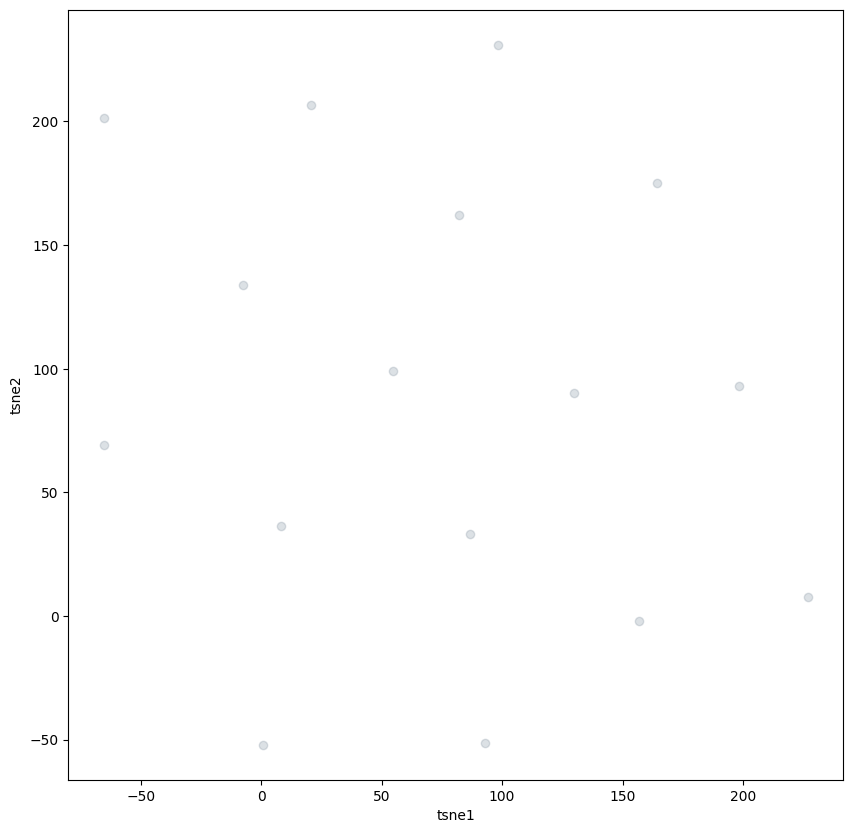

In [51]:
tsne = TSNE(n_components=2, verbose=1, perplexity=14, n_iter=5000, learning_rate=200)
tsne_scale_results = tsne.fit_transform(df_scale)
tsne_df_scale = pd.DataFrame(tsne_scale_results, columns=['tsne1', 'tsne2'])
plt.figure(figsize = (10,10))
plt.scatter(tsne_df_scale.iloc[:,0],tsne_df_scale.iloc[:,1],alpha=0.25, facecolor='lightslategray')
plt.xlabel('tsne1')
plt.ylabel('tsne2')
plt.show()

### Applying KMeans to t-SNE clusters

Text(0, 0.5, 'Inertia')

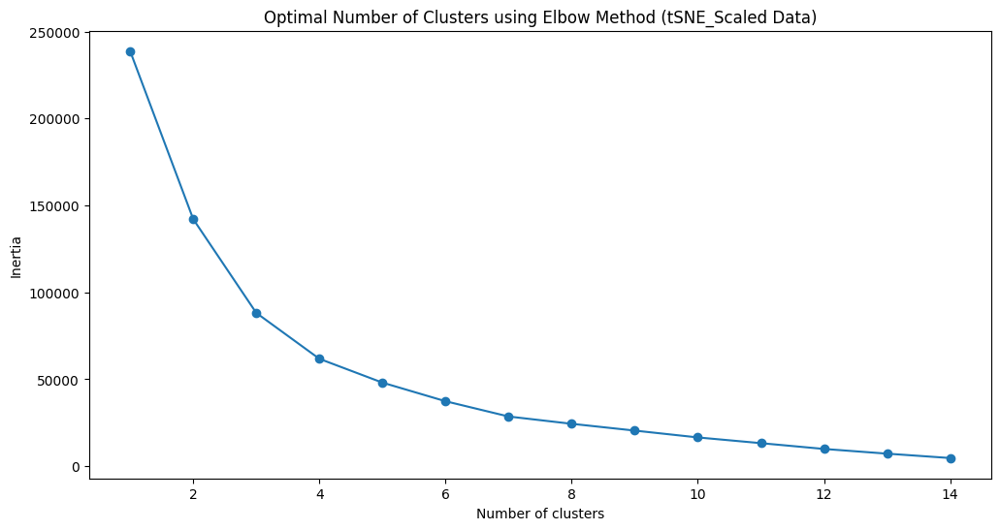

In [52]:
sse = []
k_list = range(1, 15)
for k in k_list:
    km = KMeans(n_clusters=k)
    km.fit(tsne_df_scale)
    sse.append([k, km.inertia_])
    
tsne_results_scale = pd.DataFrame({'Cluster': range(1,15), 'SSE': sse})
plt.figure(figsize=(12,6))
plt.plot(pd.DataFrame(sse)[0], pd.DataFrame(sse)[1], marker='o')
plt.title('Optimal Number of Clusters using Elbow Method (tSNE_Scaled Data)')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')

In [56]:
kmeans_tsne_scale = KMeans(n_clusters=2, n_init=100, max_iter=400, init='k-means++', random_state=42).fit(tsne_df_scale)
print('KMeans tSNE Scaled Silhouette Score: {}'.format(silhouette_score(tsne_df_scale, kmeans_tsne_scale.labels_, metric='euclidean')))
labels_tsne_scale = kmeans_tsne_scale.labels_
clusters_tsne_scale = pd.concat([tsne_df_scale, pd.DataFrame({'tsne_clusters':labels_tsne_scale})], axis=1)

KMeans tSNE Scaled Silhouette Score: 0.31570571660995483


In [60]:
kmeans_tsne_scale = KMeans(n_clusters=2, n_init=100, max_iter=400, init='k-means++', random_state=42).fit(tsne_df_scale)
print('KMeans tSNE Scaled Silhouette Score: {}'.format(silhouette_score(tsne_df_scale, kmeans_tsne_scale.labels_, metric='euclidean')))
labels_tsne_scale = kmeans_tsne_scale.labels_
clusters_tsne_scale = pd.concat([tsne_df_scale, pd.DataFrame({'tsne_clusters':labels_tsne_scale})], axis=1)

KMeans tSNE Scaled Silhouette Score: 0.31570571660995483


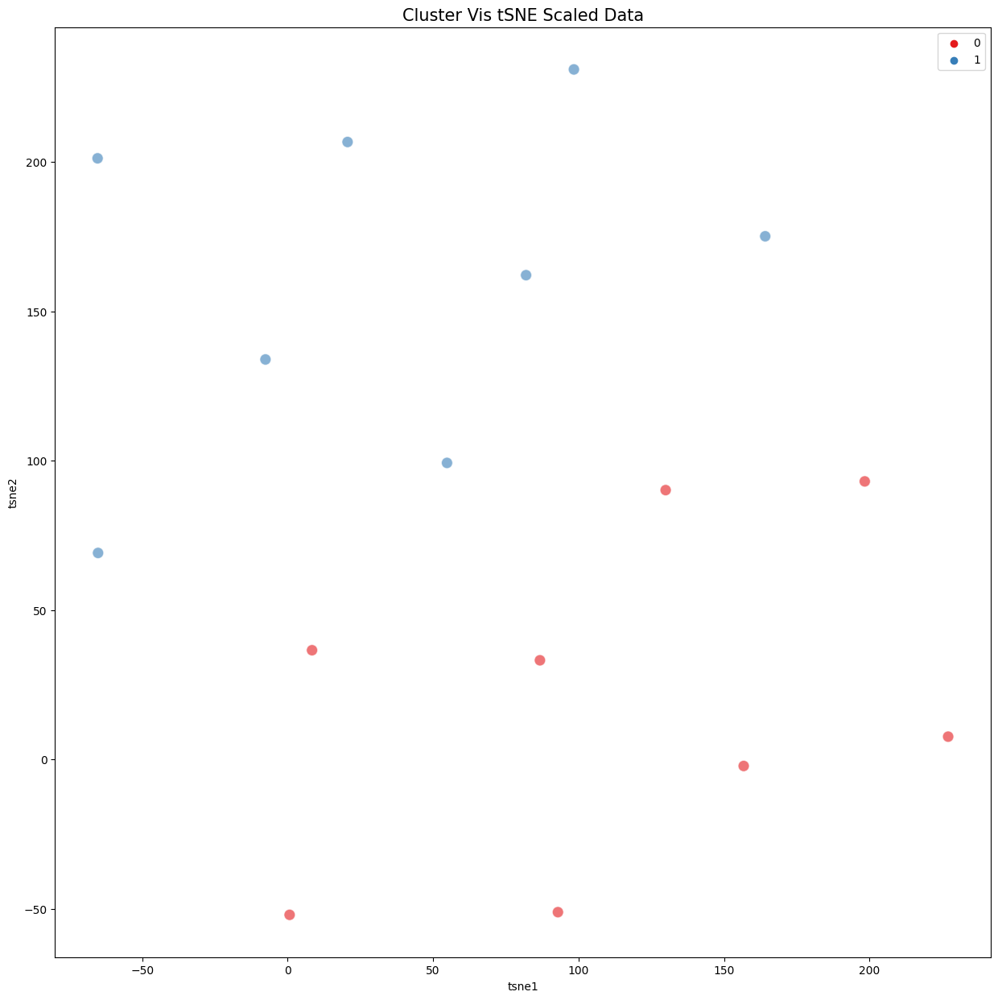

In [61]:
plt.figure(figsize = (15,15))
sns.scatterplot(x=clusters_tsne_scale.iloc[:,0],y=clusters_tsne_scale.iloc[:,1],hue=labels_tsne_scale, palette='Set1', s=100, alpha=0.6).set_title('Cluster Vis tSNE Scaled Data', fontsize=15)
plt.legend()
plt.show()

In [62]:
Scene = dict(xaxis = dict(title  = 'tsne1'),yaxis = dict(title  = 'tsne2'))
labels = labels_tsne_scale
trace = go.Scatter3d(x=clusters_tsne_scale.iloc[:,0], y=clusters_tsne_scale.iloc[:,1], z=clusters_tsne_scale.iloc[:,2], mode='markers',marker=dict(color = labels, colorscale='Viridis', size = 10, line = dict(color = 'yellow',width = 5)))
layout = go.Layout(margin=dict(l=0,r=0),scene = Scene, height = 1000,width = 1000)
data = [trace]
fig = go.Figure(data = data, layout = layout)
fig.show()

### Comparing PCA and t-SNE Derived KMeans Clusters

In [63]:
cluster_tsne_profile = pd.merge(df, clusters_tsne_scale['tsne_clusters'], left_index=True, right_index=True )
cluster_pca_profile = pd.merge(df, clusters_pca_scale['pca_clusters'], left_index=True, right_index=True )

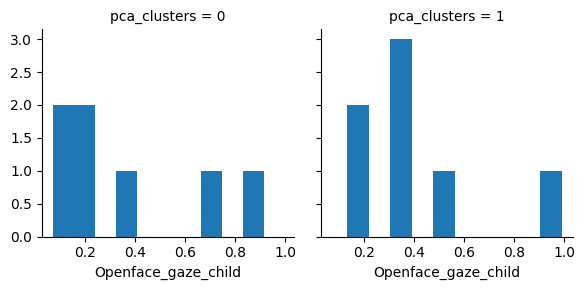

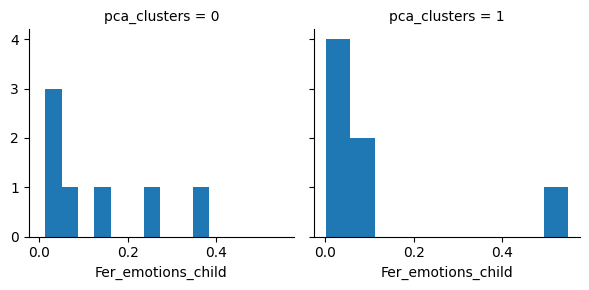

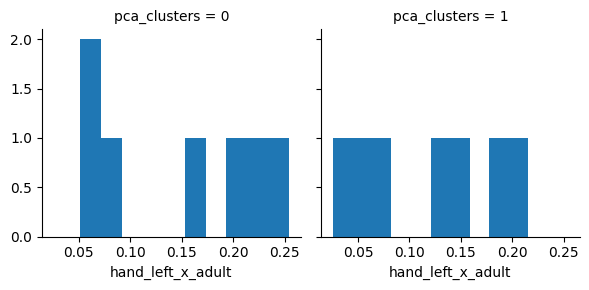

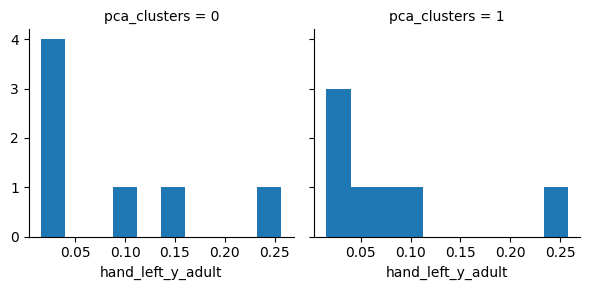

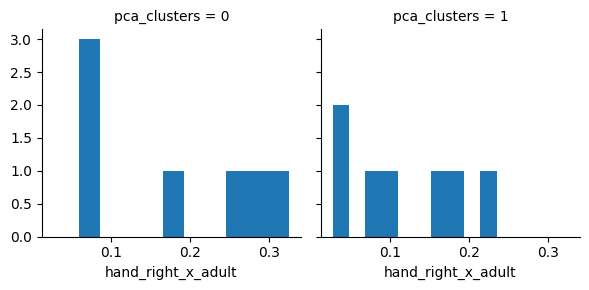

...

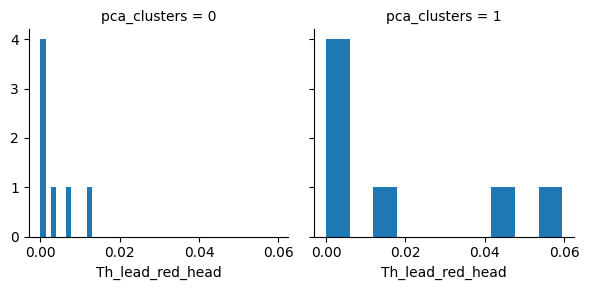

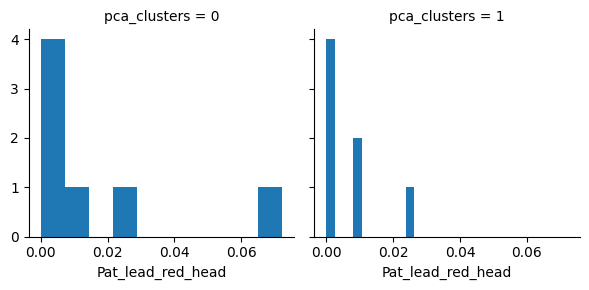

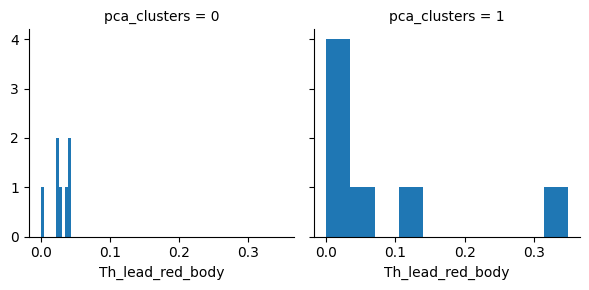

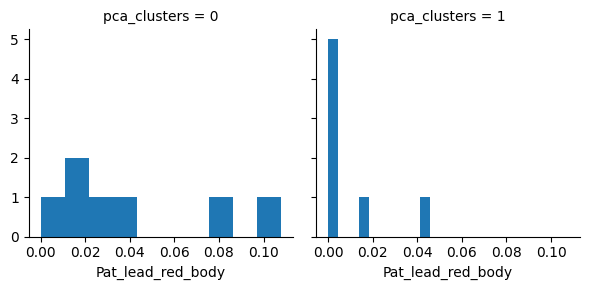

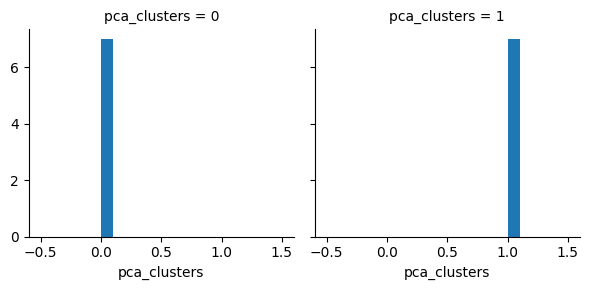

In [64]:
for c in cluster_pca_profile:
    grid = sns.FacetGrid(cluster_pca_profile, col='pca_clusters')
    grid.map(plt.hist, c)

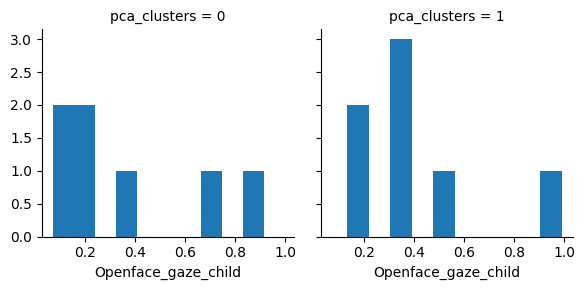

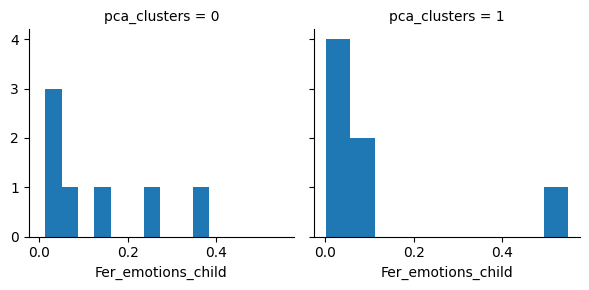

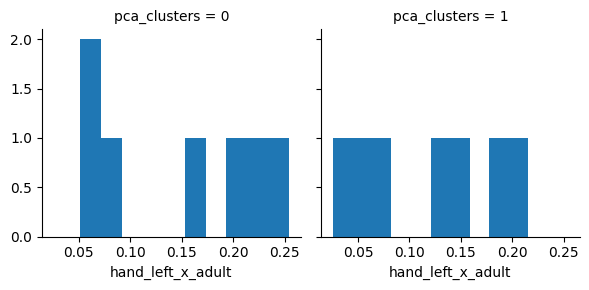

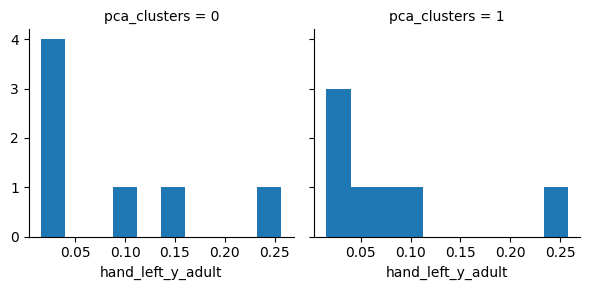

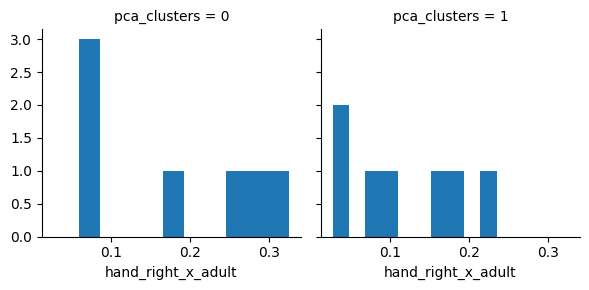

...

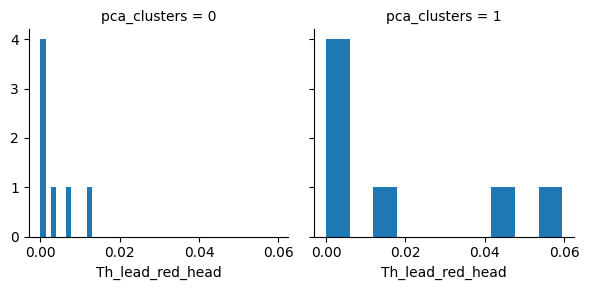

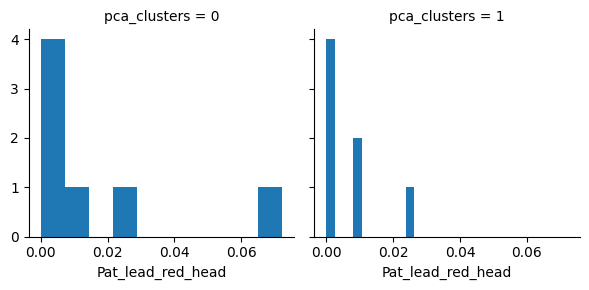

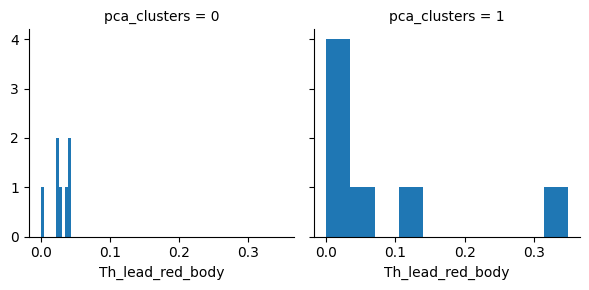

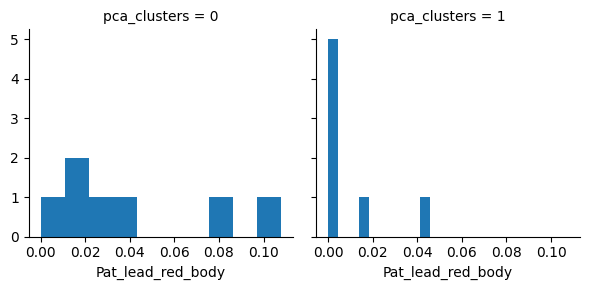

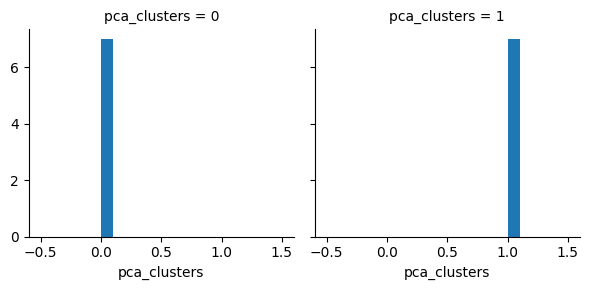

In [65]:
for c in cluster_pca_profile:
    grid = sns.FacetGrid(cluster_pca_profile, col='pca_clusters')
    grid.map(plt.hist, c)

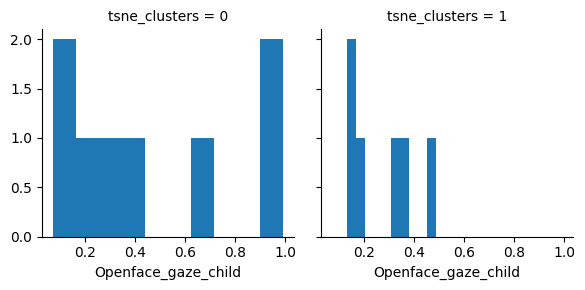

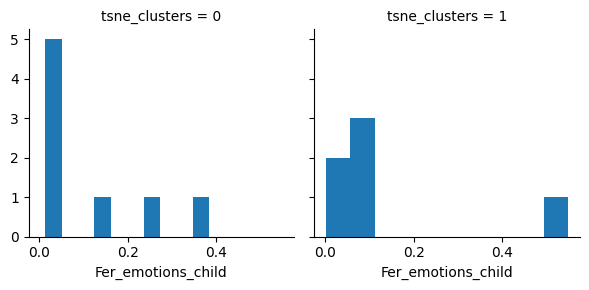

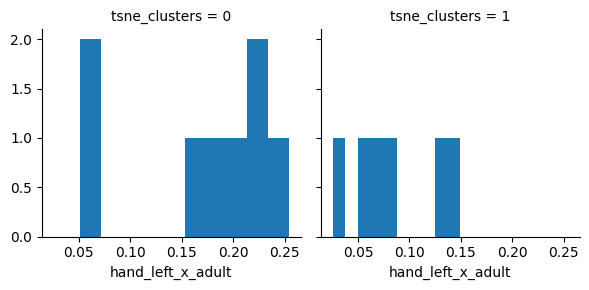

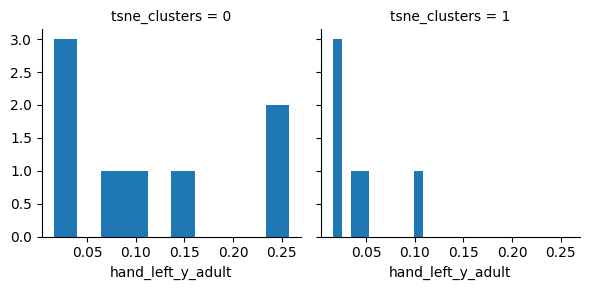

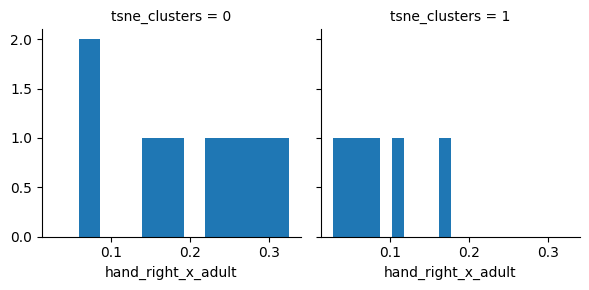

...

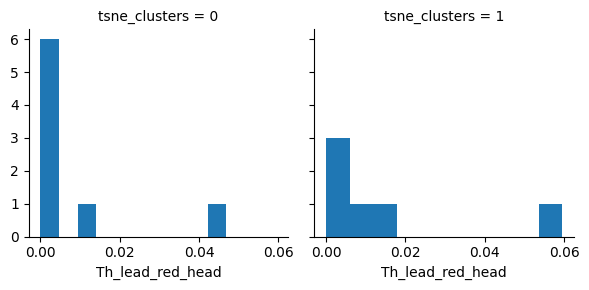

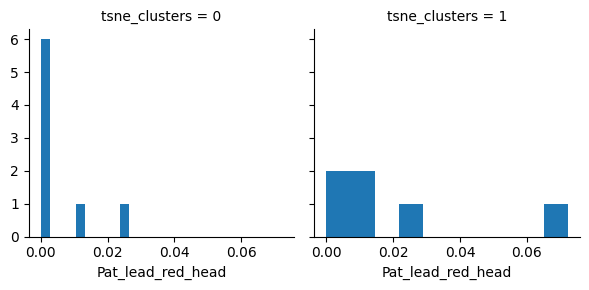

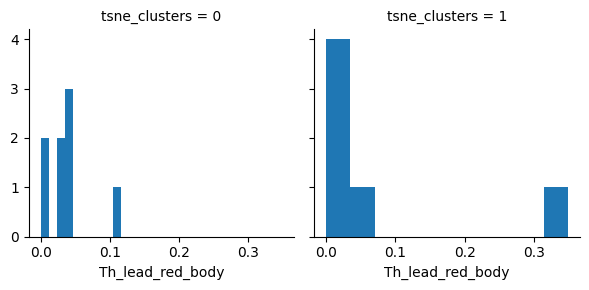

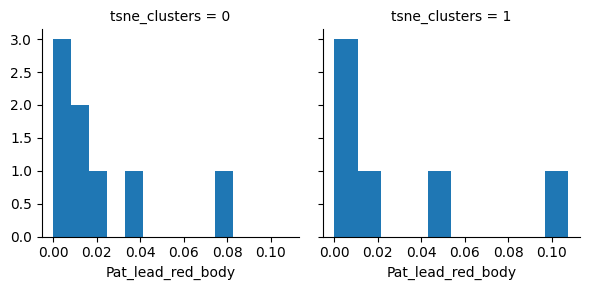

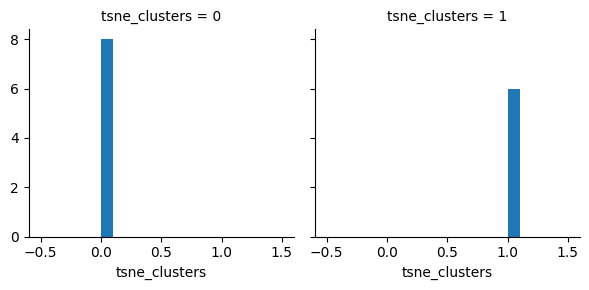

In [66]:
for c in cluster_tsne_profile:
    grid = sns.FacetGrid(cluster_tsne_profile, col='tsne_clusters')
    grid.map(plt.hist, c)

Text(0.5, 1.0, '(tSNE) Clusters by patient emotion and patient head')

<Figure size 1500x1000 with 0 Axes>

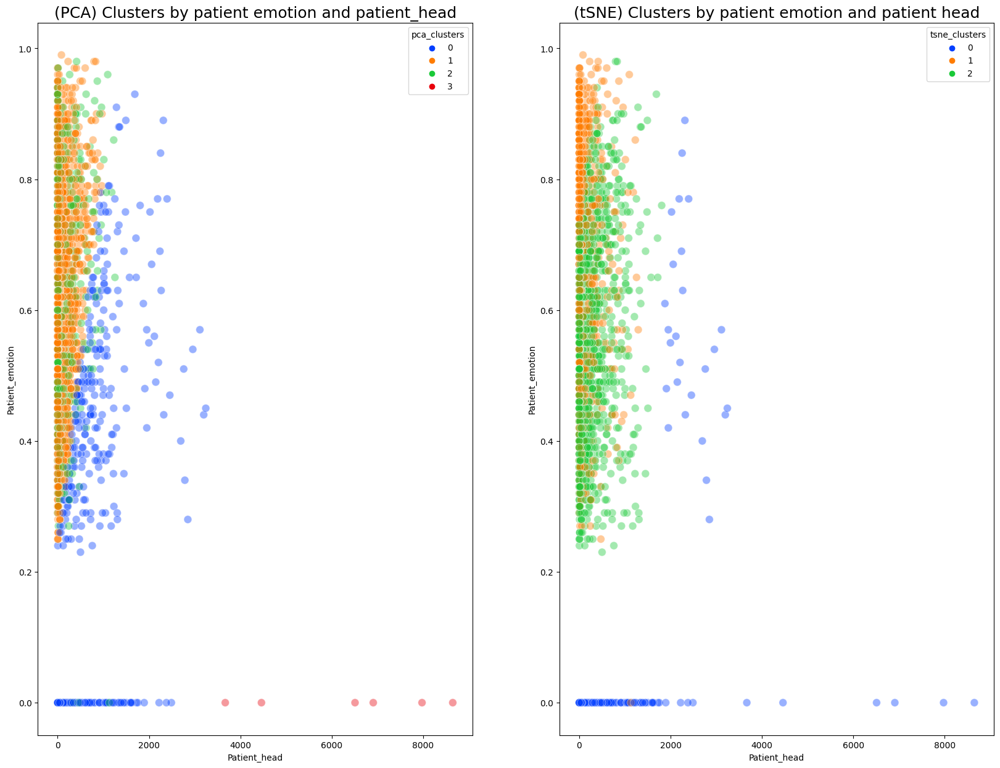

In [34]:
plt.figure(figsize=(15,10))
fig , (ax1, ax2) = plt.subplots(1,2, figsize=(20,15))
sns.scatterplot(data=cluster_pca_profile, x='Patient_head', y='Patient_emotion', 
                hue='pca_clusters', s=85, alpha=0.4, palette='bright', ax=ax1).set_title(
    '(PCA) Clusters by patient emotion and patient_head',fontsize=18)
sns.scatterplot(data=cluster_tsne_profile, x='Patient_head', y='Patient_emotion', 
                hue='tsne_clusters', s=85, alpha=0.4, palette='bright', ax=ax2).set_title('(tSNE) Clusters by patient emotion and patient head', fontsize=18)

Text(0.5, 1.0, '(tSNE) Clusters by patient emotion and patient head')

<Figure size 1500x1000 with 0 Axes>

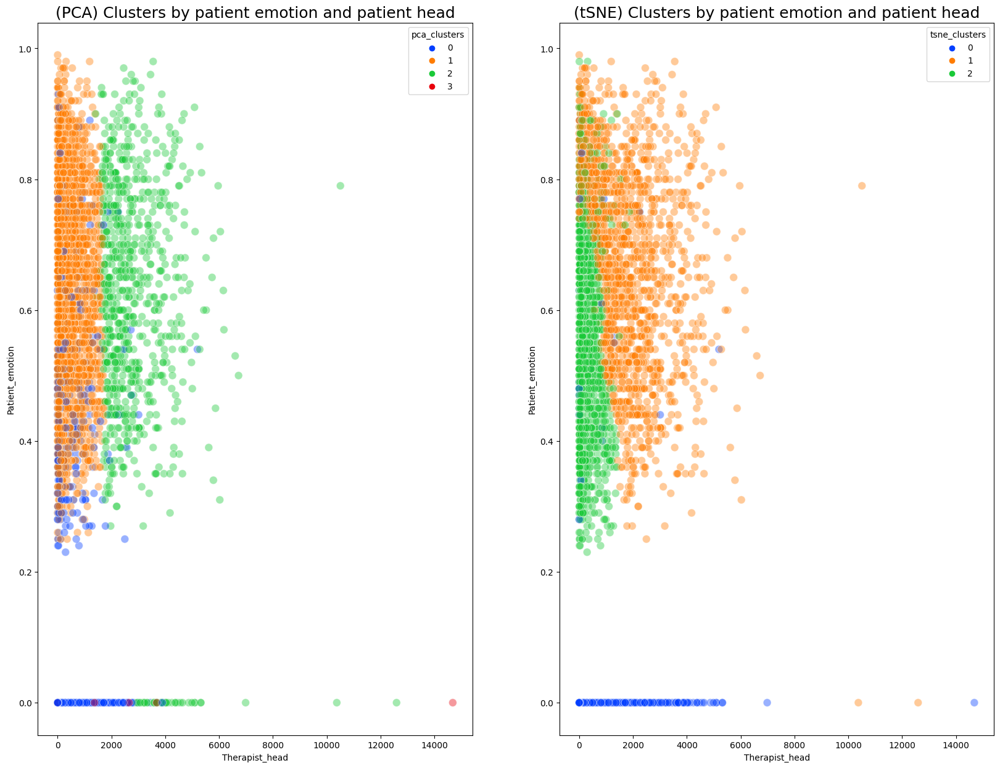

In [35]:
plt.figure(figsize=(15,10))
fig , (ax1, ax2) = plt.subplots(1,2, figsize=(20,15))
sns.scatterplot(data=cluster_pca_profile, y='Patient_emotion', x='Therapist_head', 
                hue='pca_clusters', s=85, alpha=0.4, palette='bright', ax=ax1).set_title(
    '(PCA) Clusters by patient emotion and patient head',fontsize=18)
sns.scatterplot(data=cluster_tsne_profile, y='Patient_emotion', x='Therapist_head', 
                hue='tsne_clusters', s=85, alpha=0.4, palette='bright', ax=ax2).set_title('(tSNE) Clusters by patient emotion and patient head', fontsize=18)

Text(0.5, 1.0, '(tSNE) Clusters by patient head and therapist head')

<Figure size 1500x1000 with 0 Axes>

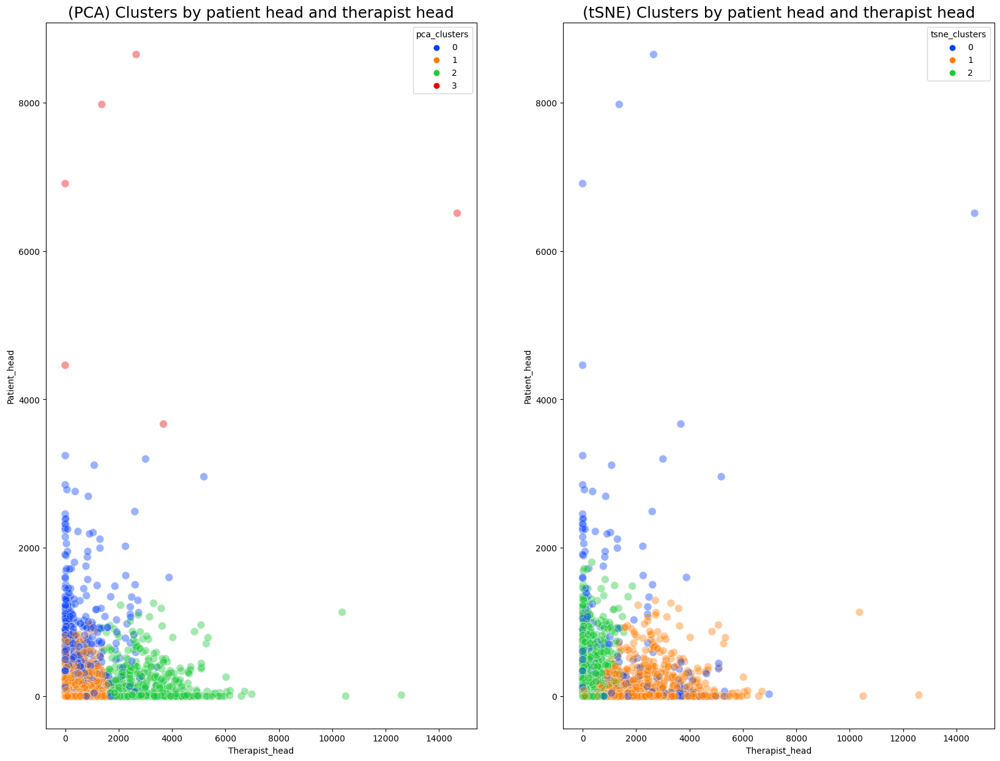

In [33]:
plt.figure(figsize=(15,10))
fig , (ax1, ax2) = plt.subplots(1,2, figsize=(20,15))
sns.scatterplot(data=cluster_pca_profile, y='Patient_head', x='Therapist_head', 
                hue='pca_clusters', s=85, alpha=0.4, palette='bright', ax=ax1).set_title(
    '(PCA) Clusters by patient head and therapist head',fontsize=18)
sns.scatterplot(data=cluster_tsne_profile, y='Patient_head', x='Therapist_head', 
                hue='tsne_clusters', s=85, alpha=0.4, palette='bright', ax=ax2).set_title('(tSNE) Clusters by patient head and therapist head', fontsize=18)

#### REMOVING OUTLIERS

In [37]:
df1 = pd.read_csv(r'C:\Users\MJAR0016\Desktop\data\2092-BDH\2092-BDH.csv')
df1.head()
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4047 entries, 0 to 4046
Data columns (total 5 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Patient_emotion  4047 non-null   float64
 1   Patient_head     4047 non-null   int64  
 2   Patient_body     4047 non-null   int64  
 3   Therapist_head   4047 non-null   int64  
 4   Therapist_body   4047 non-null   int64  
dtypes: float64(1), int64(4)
memory usage: 158.2 KB


In [38]:
with open(r'C:\Users\MJAR0016\Desktop\data\2092-BDH\2092-BDH.csv') as f:
    df1 =  pd.read_csv(f, usecols=['Patient_emotion', 'Patient_head', 'Therapist_head'])
f.close()

df1 =df1[df1['Patient_emotion'] !=0]
df1 =df1[df1['Patient_head'] <=4000]
df1 =df1[df1['Therapist_head'] <=8000]
df1.head(10)

,Patient_emotion,Patient_head,Therapist_head
0,0.51,312,83
1,0.45,384,112
3,0.53,2,6596
4,0.76,10,4377
5,0.69,5,3895
6,0.72,60,6046
7,0.77,75,2266
8,0.83,177,4253
12,0.45,0,318
13,0.83,0,0


In [50]:
#df1.info()
df1.max(axis=1)

0        312.0
1        384.0
3       6596.0
4       4377.0
5       3895.0
         ...  
4027    2499.0
4028     711.0
4029     505.0
4030     246.0
4037    6024.0
Length: 3620, dtype: float64

In [51]:
scaler = StandardScaler()
scaler.fit(df1)
X_scale = scaler.transform(df1)
df_scale = pd.DataFrame(X_scale, columns=df1.columns)
df_scale.head()

,Patient_emotion,Patient_head,Therapist_head
0,-0.660911,0.528585,-0.752679
1,-1.045300,0.759898,-0.727322
2,-0.532782,-0.467344,4.941971
3,0.940708,-0.441642,3.001786
4,0.492255,-0.457706,2.580349


Text(0, 0.5, 'Inertia')

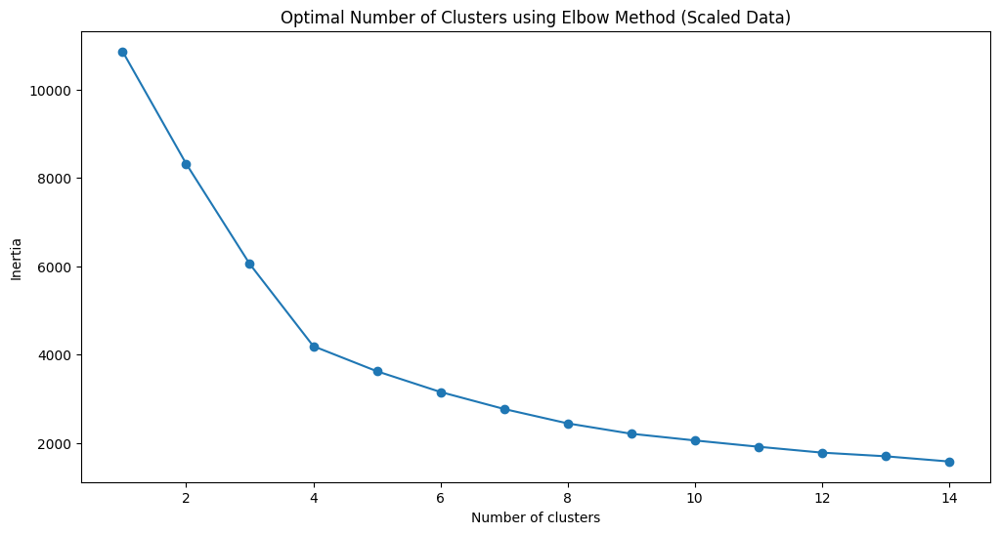

In [52]:
sse = []
k_list = range(1, 15)
for k in k_list:
    km = KMeans(n_clusters=k)
    km.fit(df_scale)
    sse.append([k, km.inertia_])
    
oca_results_scale = pd.DataFrame({'Cluster': range(1,15), 'SSE': sse})
plt.figure(figsize=(12,6))
plt.plot(pd.DataFrame(sse)[0], pd.DataFrame(sse)[1], marker='o')
plt.title('Optimal Number of Clusters using Elbow Method (Scaled Data)')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')

In [53]:
df_scale2 = df_scale.copy()
kmeans_scale = KMeans(n_clusters=4, n_init=100, max_iter=400, init='k-means++', random_state=42).fit(df_scale2)
print('KMeans Scaled Silhouette Score: {}'.format(silhouette_score(df_scale2, kmeans_scale.labels_, metric='euclidean')))
labels_scale = kmeans_scale.labels_
clusters_scale = pd.concat([df_scale2, pd.DataFrame({'cluster_scaled':labels_scale})], axis=1)

KMeans Scaled Silhouette Score: 0.3679762254178643


In [54]:
df_scale2 = df_scale.copy()
kmeans_scale = KMeans(n_clusters=3, n_init=100, max_iter=400, init='k-means++', random_state=42).fit(df_scale2)
print('KMeans Scaled Silhouette Score: {}'.format(silhouette_score(df_scale2, kmeans_scale.labels_, metric='euclidean')))
labels_scale = kmeans_scale.labels_
clusters_scale = pd.concat([df_scale2, pd.DataFrame({'cluster_scaled':labels_scale})], axis=1)

KMeans Scaled Silhouette Score: 0.3811156319403748


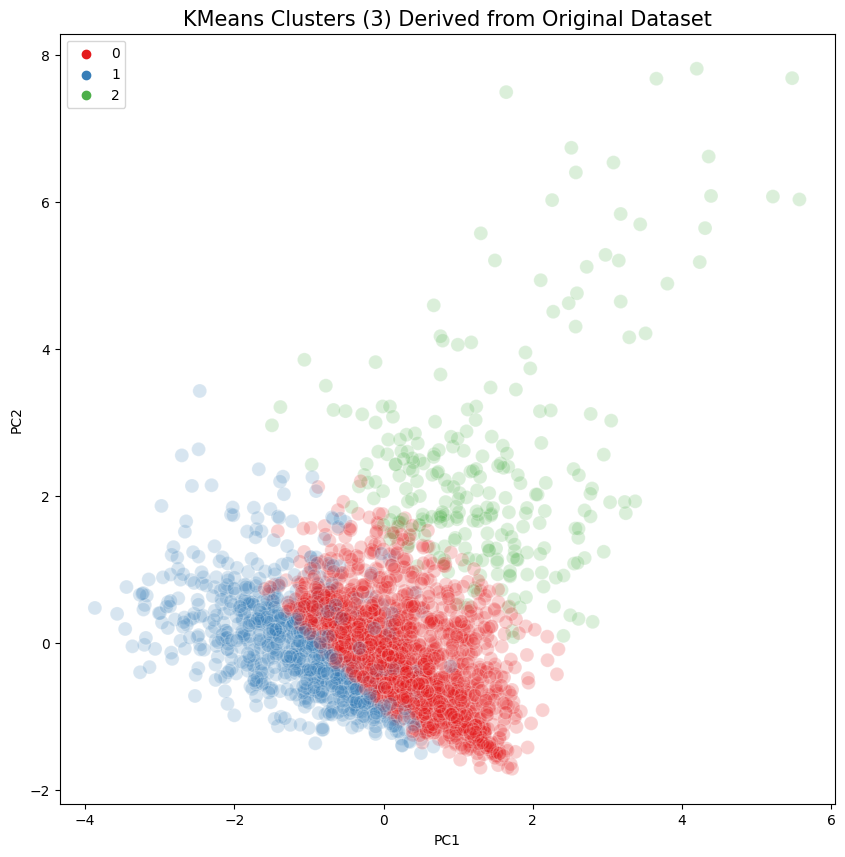

In [55]:
pca2 = PCA(n_components=2).fit(df_scale2)
pca2d = pca2.transform(df_scale2)
plt.figure(figsize = (10,10))
sns.scatterplot(x=pca2d[:,0], y=pca2d[:,1],
                hue=labels_scale, 
                palette='Set1',
                s=100, alpha=0.2).set_title('KMeans Clusters (3) Derived from Original Dataset', fontsize=15)
plt.legend()
plt.ylabel('PC2')
plt.xlabel('PC1')
plt.show()

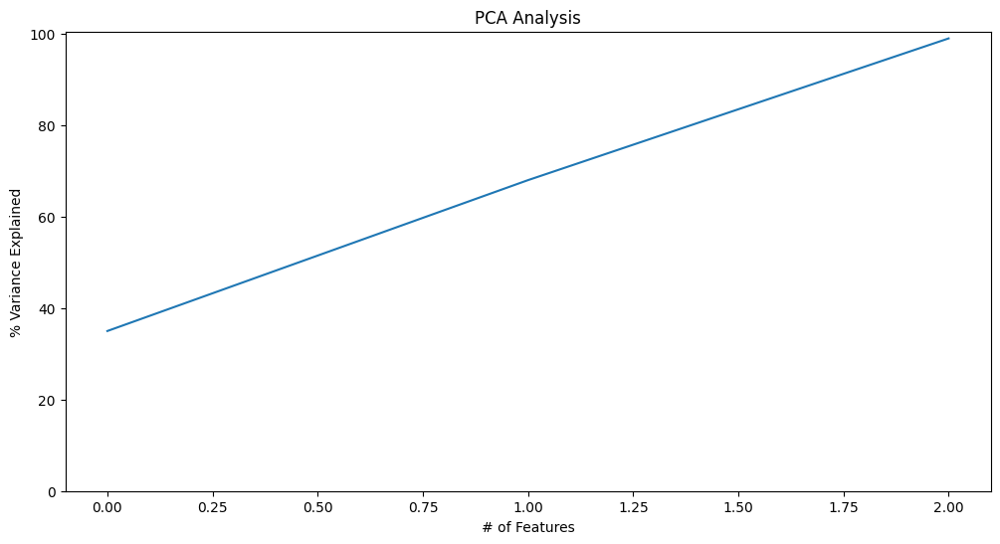

In [56]:
# 3 features in dataset
pca = PCA(n_components=3)
pca.fit(df_scale)
variance = pca.explained_variance_ratio_
var = np.cumsum(np.round(variance, 2)*100)
plt.figure(figsize=(12,6))
plt.ylabel('% Variance Explained')
plt.xlabel('# of Features')
plt.title('PCA Analysis')
plt.ylim(0,100.5)
plt.plot(var)

In [57]:
pca = PCA(n_components=2)
pca_scale = pca.fit_transform(df_scale)
pca_df_scale = pd.DataFrame(pca_scale, columns=['pc1','pc2'])
print(pca.explained_variance_ratio_)

[0.35431058 0.33077256]


Text(0, 0.5, 'Inertia')

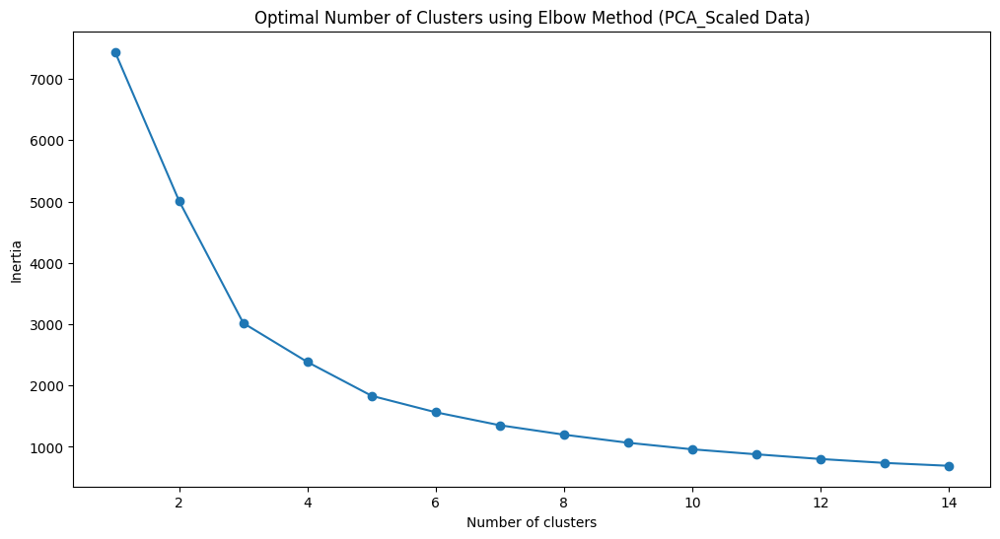

In [58]:
sse = []
k_list = range(1, 15)
for k in k_list:
    km = KMeans(n_clusters=k)
    
    km.fit(pca_df_scale)
    sse.append([k, km.inertia_])
    
pca_results_scale = pd.DataFrame({'Cluster': range(1,15), 'SSE': sse})
plt.figure(figsize=(12,6))
plt.plot(pd.DataFrame(sse)[0], pd.DataFrame(sse)[1], marker='o')
plt.title('Optimal Number of Clusters using Elbow Method (PCA_Scaled Data)')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')

In [59]:
kmeans_pca_scale = KMeans(n_clusters=3, n_init=100, max_iter=400, init='k-means++', random_state=42).fit(pca_df_scale)
print('KMeans PCA Scaled Silhouette Score: {}'.format(silhouette_score(pca_df_scale, kmeans_pca_scale.labels_, metric='euclidean')))
labels_pca_scale = kmeans_pca_scale.labels_
clusters_pca_scale = pd.concat([pca_df_scale, pd.DataFrame({'pca_clusters':labels_pca_scale})], axis=1)

KMeans PCA Scaled Silhouette Score: 0.43174288389111504


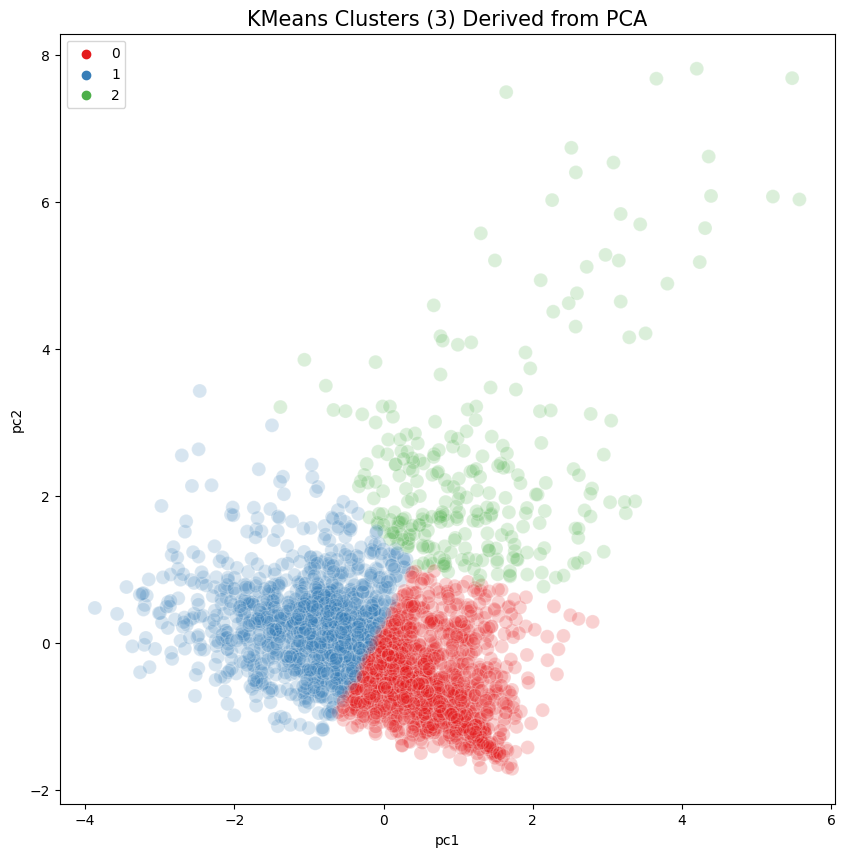

In [60]:
plt.figure(figsize = (10,10))
sns.scatterplot(x=clusters_pca_scale.iloc[:,0],y=clusters_pca_scale.iloc[:,1], hue=labels_pca_scale, palette='Set1', s=100, alpha=0.2).set_title('KMeans Clusters (3) Derived from PCA', fontsize=15)
plt.legend()
plt.show()

[t-SNE] Computing 241 nearest neighbors...
[t-SNE] Indexed 3620 samples in 0.004s...
[t-SNE] Computed neighbors for 3620 samples in 0.234s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3620
[t-SNE] Computed conditional probabilities for sample 2000 / 3620
[t-SNE] Computed conditional probabilities for sample 3000 / 3620
[t-SNE] Computed conditional probabilities for sample 3620 / 3620
[t-SNE] Mean sigma: 0.179700
[t-SNE] KL divergence after 250 iterations with early exaggeration: 62.897957
[t-SNE] KL divergence after 5000 iterations: 0.706039


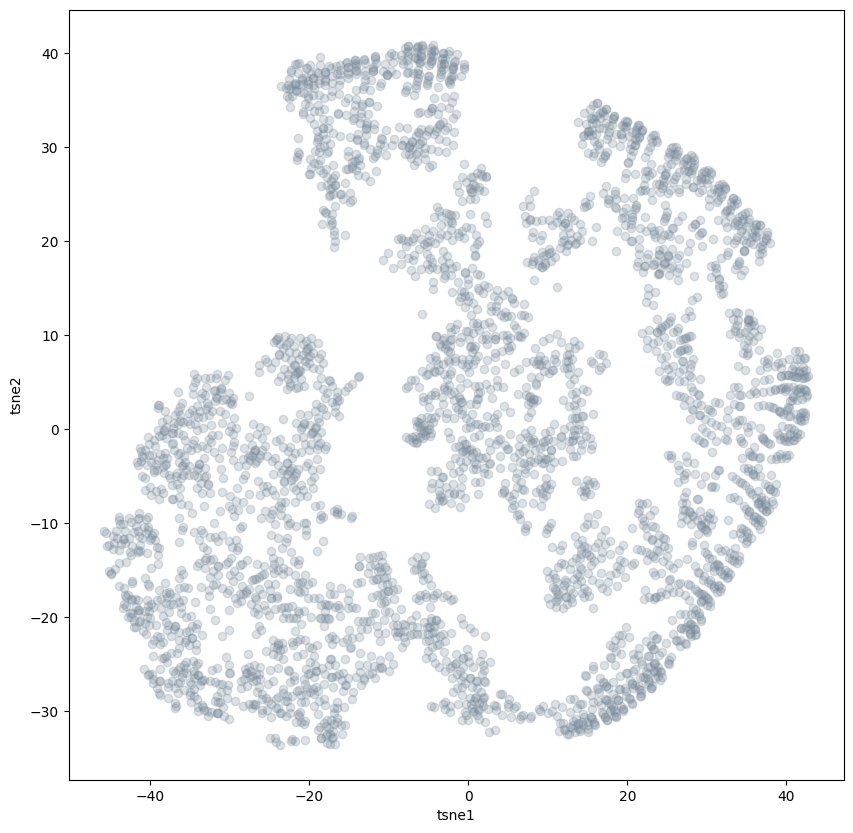

In [61]:
tsne = TSNE(n_components=2, verbose=1, perplexity=80, n_iter=5000, learning_rate=200)
tsne_scale_results = tsne.fit_transform(df_scale)
tsne_df_scale = pd.DataFrame(tsne_scale_results, columns=['tsne1', 'tsne2'])
plt.figure(figsize = (10,10))
plt.scatter(tsne_df_scale.iloc[:,0],tsne_df_scale.iloc[:,1],alpha=0.25, facecolor='lightslategray')
plt.xlabel('tsne1')
plt.ylabel('tsne2')
plt.show()

Text(0, 0.5, 'Inertia')

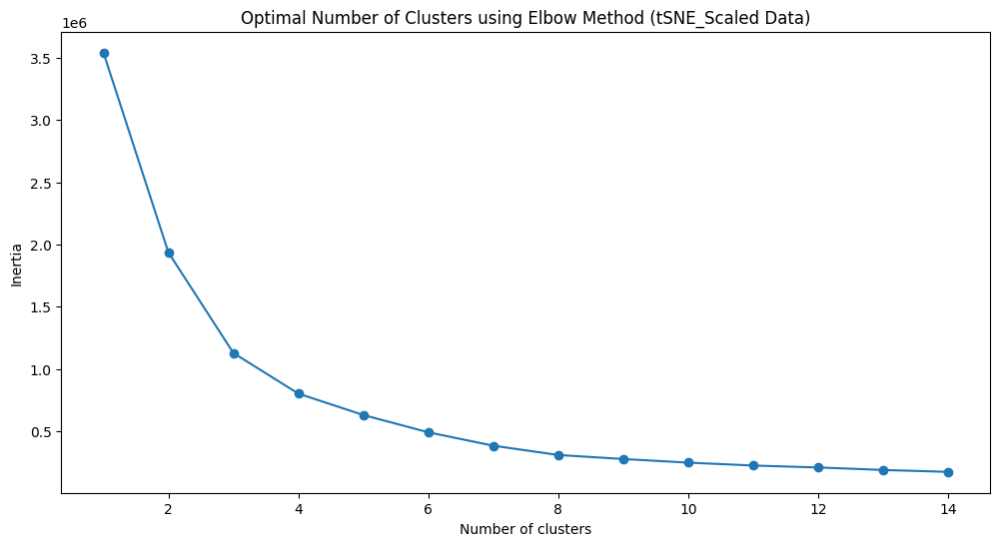

In [62]:
sse = []
k_list = range(1, 15)
for k in k_list:
    km = KMeans(n_clusters=k)
    km.fit(tsne_df_scale)
    sse.append([k, km.inertia_])
    
tsne_results_scale = pd.DataFrame({'Cluster': range(1,15), 'SSE': sse})
plt.figure(figsize=(12,6))
plt.plot(pd.DataFrame(sse)[0], pd.DataFrame(sse)[1], marker='o')
plt.title('Optimal Number of Clusters using Elbow Method (tSNE_Scaled Data)')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')

In [63]:
kmeans_tsne_scale = KMeans(n_clusters=4, n_init=100, max_iter=400, init='k-means++', random_state=42).fit(tsne_df_scale)
print('KMeans tSNE Scaled Silhouette Score: {}'.format(silhouette_score(tsne_df_scale, kmeans_tsne_scale.labels_, metric='euclidean')))
labels_tsne_scale = kmeans_tsne_scale.labels_
clusters_tsne_scale = pd.concat([tsne_df_scale, pd.DataFrame({'tsne_clusters':labels_tsne_scale})], axis=1)

KMeans tSNE Scaled Silhouette Score: 0.44148656725883484


In [64]:
kmeans_tsne_scale = KMeans(n_clusters=3, n_init=100, max_iter=400, init='k-means++', random_state=42).fit(tsne_df_scale)
print('KMeans tSNE Scaled Silhouette Score: {}'.format(silhouette_score(tsne_df_scale, kmeans_tsne_scale.labels_, metric='euclidean')))
labels_tsne_scale = kmeans_tsne_scale.labels_
clusters_tsne_scale = pd.concat([tsne_df_scale, pd.DataFrame({'tsne_clusters':labels_tsne_scale})], axis=1)

KMeans tSNE Scaled Silhouette Score: 0.4457114338874817


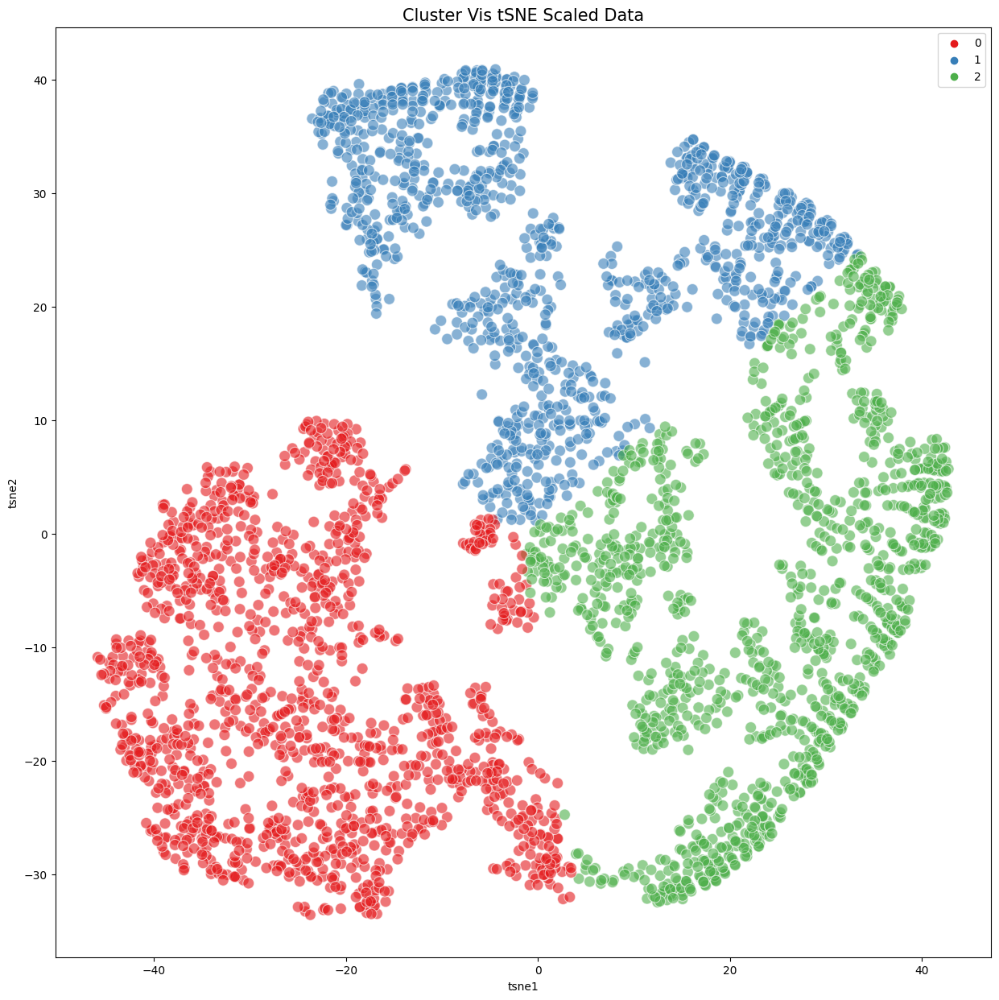

In [65]:
plt.figure(figsize = (15,15))
sns.scatterplot(x=clusters_tsne_scale.iloc[:,0],y=clusters_tsne_scale.iloc[:,1],hue=labels_tsne_scale, palette='Set1', s=100, alpha=0.6).set_title('Cluster Vis tSNE Scaled Data', fontsize=15)
plt.legend()
plt.show()

In [66]:
Scene = dict(xaxis = dict(title  = 'tsne1'),yaxis = dict(title  = 'tsne2'))
labels = labels_tsne_scale
trace = go.Scatter3d(x=clusters_tsne_scale.iloc[:,0], y=clusters_tsne_scale.iloc[:,1], z=clusters_tsne_scale.iloc[:,2], mode='markers',marker=dict(color = labels, colorscale='Viridis', size = 10, line = dict(color = 'yellow',width = 5)))
layout = go.Layout(margin=dict(l=0,r=0),scene = Scene, height = 1000,width = 1000)
data = [trace]
fig = go.Figure(data = data, layout = layout)
fig.show()

In [67]:
cluster_tsne_profile = pd.merge(df1, clusters_tsne_scale['tsne_clusters'], left_index=True, right_index=True )
cluster_pca_profile = pd.merge(df1, clusters_pca_scale['pca_clusters'], left_index=True, right_index=True )

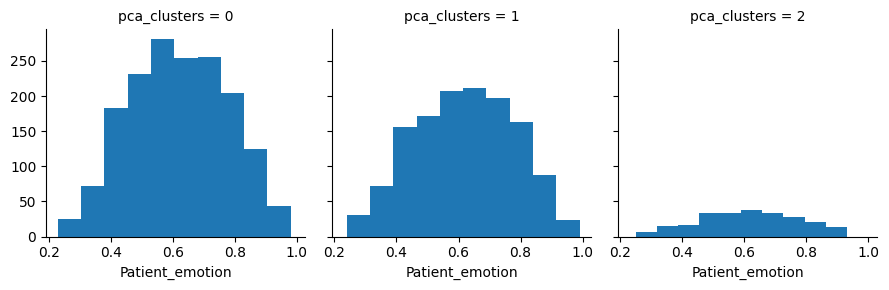

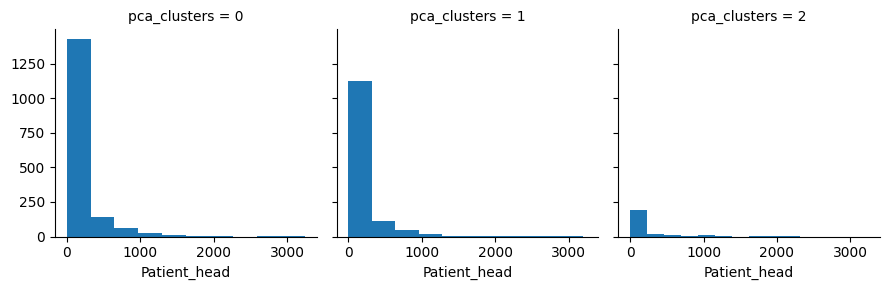

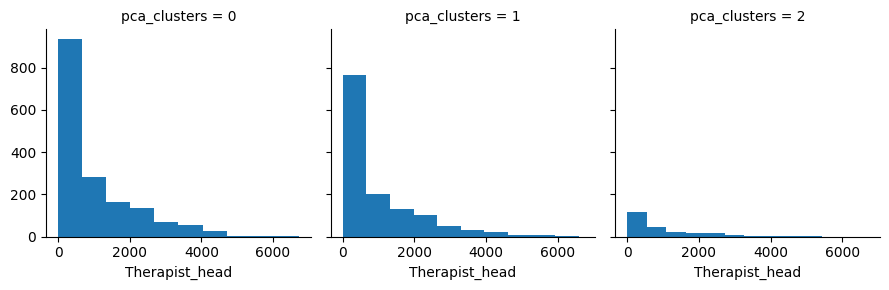

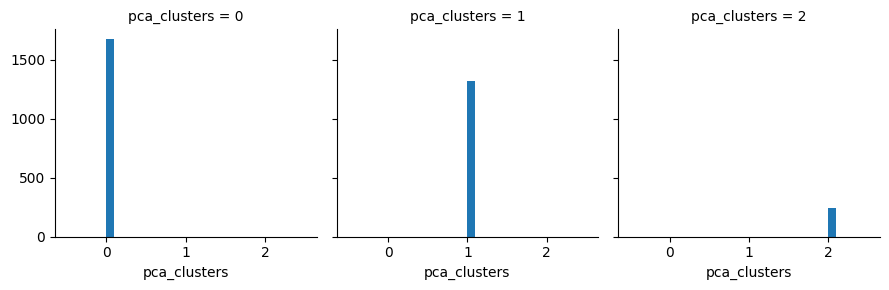

In [68]:
for c in cluster_pca_profile:
    grid = sns.FacetGrid(cluster_pca_profile, col='pca_clusters')
    grid.map(plt.hist, c)

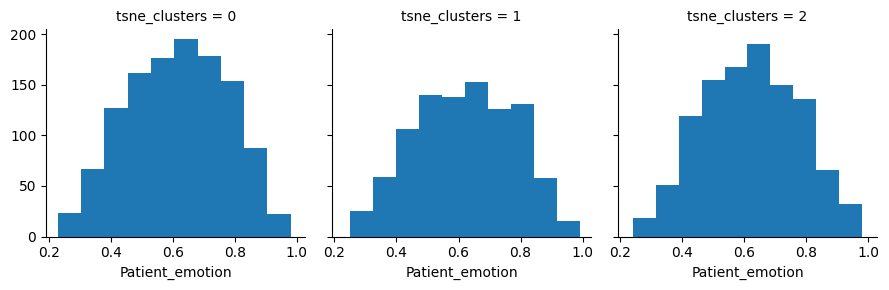

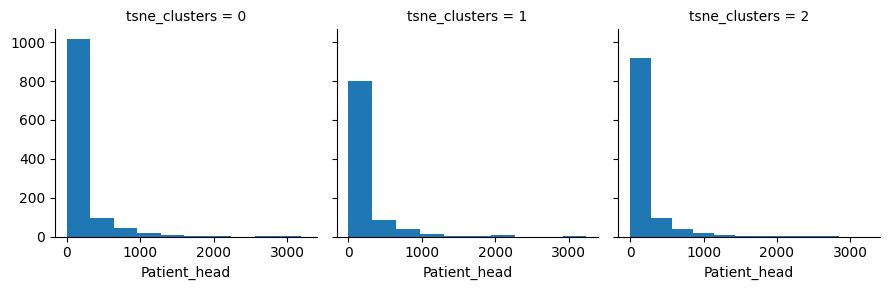

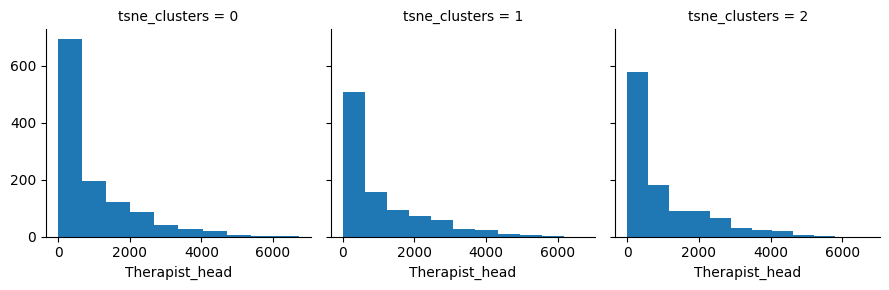

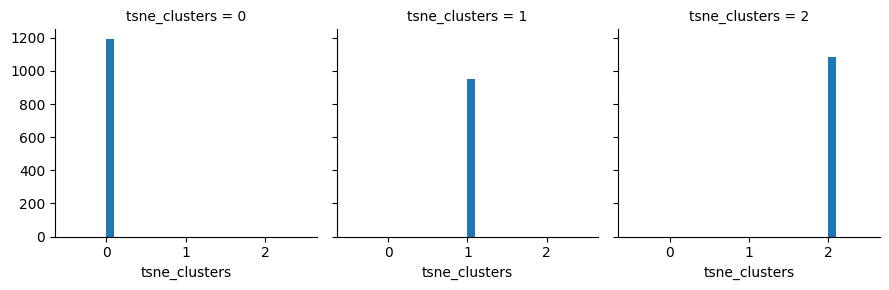

In [69]:
for c in cluster_tsne_profile:
    grid = sns.FacetGrid(cluster_tsne_profile, col='tsne_clusters')
    grid.map(plt.hist, c)

Text(0.5, 1.0, '(tSNE) Clusters by patient emotion and patient head')

<Figure size 1500x1000 with 0 Axes>

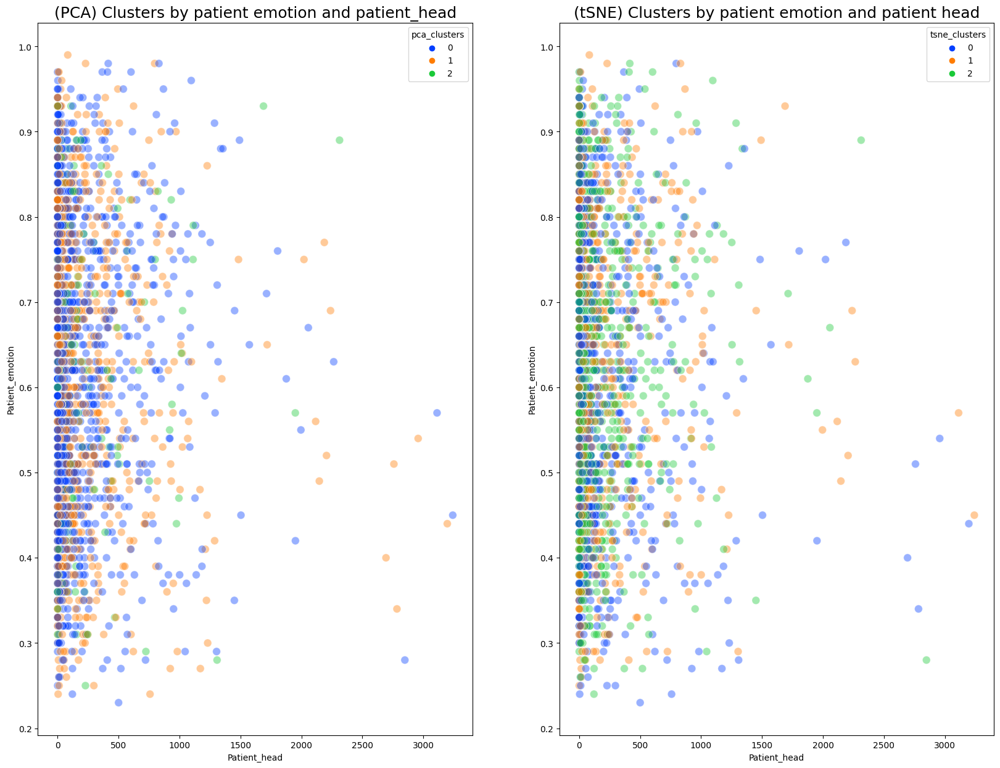

In [70]:
plt.figure(figsize=(15,10))
fig , (ax1, ax2) = plt.subplots(1,2, figsize=(20,15))
sns.scatterplot(data=cluster_pca_profile, x='Patient_head', y='Patient_emotion', 
                hue='pca_clusters', s=85, alpha=0.4, palette='bright', ax=ax1).set_title(
    '(PCA) Clusters by patient emotion and patient_head',fontsize=18)
sns.scatterplot(data=cluster_tsne_profile, x='Patient_head', y='Patient_emotion', 
                hue='tsne_clusters', s=85, alpha=0.4, palette='bright', ax=ax2).set_title('(tSNE) Clusters by patient emotion and patient head', fontsize=18)

Text(0.5, 1.0, '(tSNE) Clusters by patient emotion and patient head')

<Figure size 1500x1000 with 0 Axes>

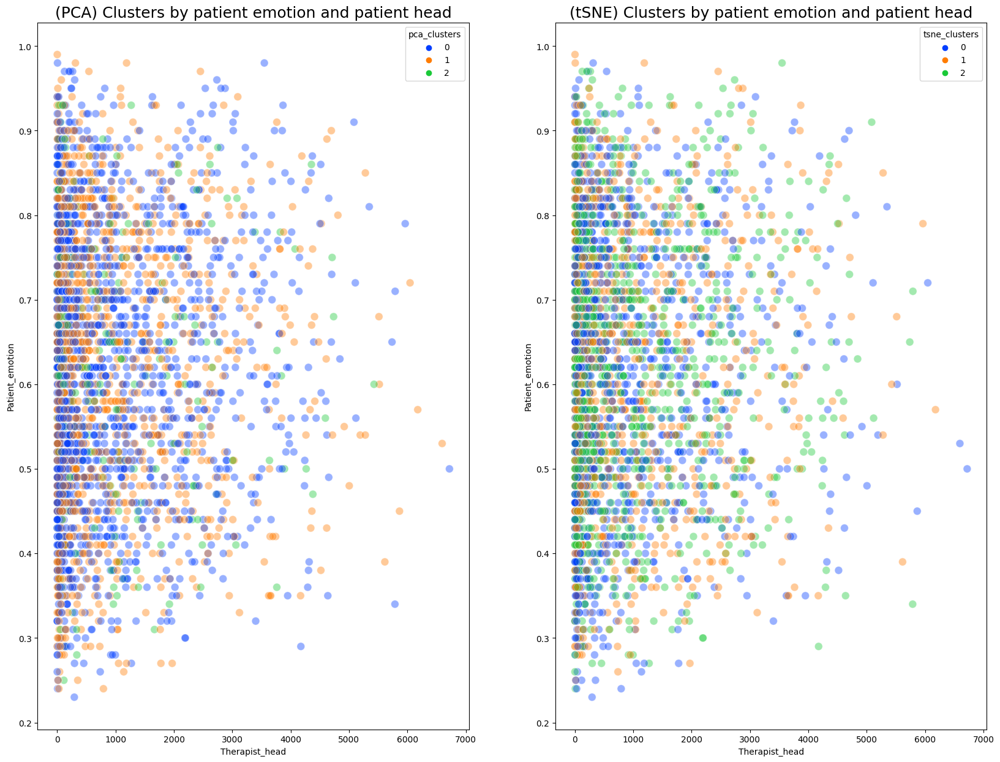

In [71]:
plt.figure(figsize=(15,10))
fig , (ax1, ax2) = plt.subplots(1,2, figsize=(20,15))
sns.scatterplot(data=cluster_pca_profile, y='Patient_emotion', x='Therapist_head', 
                hue='pca_clusters', s=85, alpha=0.4, palette='bright', ax=ax1).set_title(
    '(PCA) Clusters by patient emotion and patient head',fontsize=18)
sns.scatterplot(data=cluster_tsne_profile, y='Patient_emotion', x='Therapist_head', 
                hue='tsne_clusters', s=85, alpha=0.4, palette='bright', ax=ax2).set_title('(tSNE) Clusters by patient emotion and patient head', fontsize=18)

Text(0.5, 1.0, '(tSNE) Clusters by patient head and therapist head')

<Figure size 1500x1000 with 0 Axes>

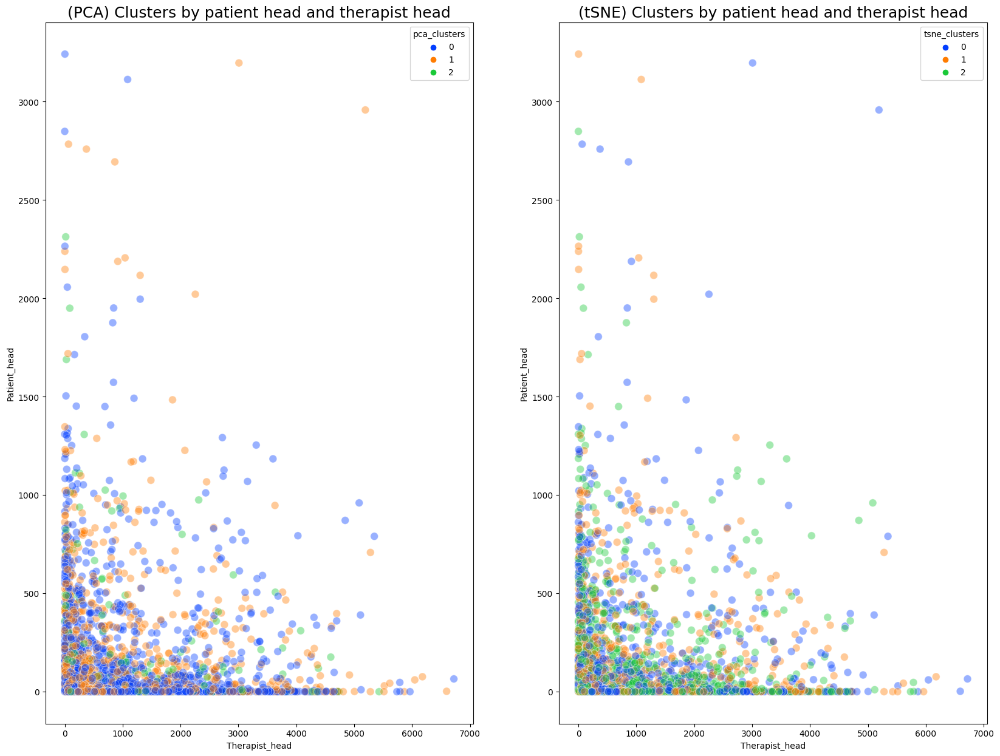

In [72]:
plt.figure(figsize=(15,10))
fig , (ax1, ax2) = plt.subplots(1,2, figsize=(20,15))
sns.scatterplot(data=cluster_pca_profile, y='Patient_head', x='Therapist_head', 
                hue='pca_clusters', s=85, alpha=0.4, palette='bright', ax=ax1).set_title(
    '(PCA) Clusters by patient head and therapist head',fontsize=18)
sns.scatterplot(data=cluster_tsne_profile, y='Patient_head', x='Therapist_head', 
                hue='tsne_clusters', s=85, alpha=0.4, palette='bright', ax=ax2).set_title('(tSNE) Clusters by patient head and therapist head', fontsize=18)

Text(0.5, 1.0, '(tSNE) Clusters by patient emotion and patient head')

<Figure size 1500x1000 with 0 Axes>

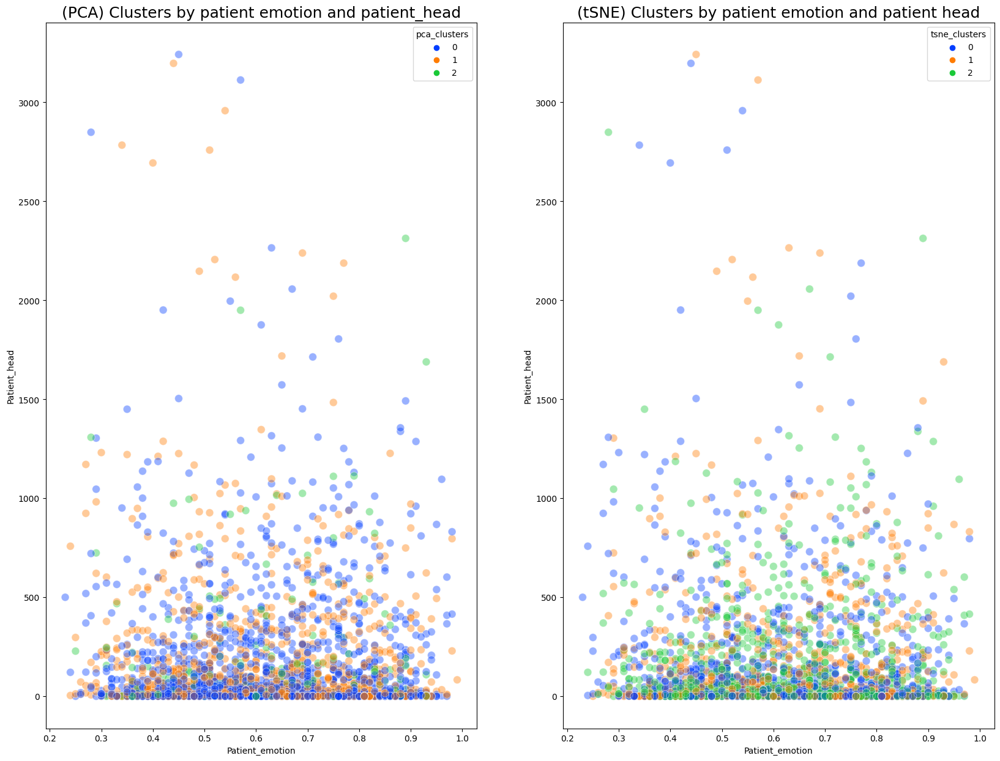

In [74]:
plt.figure(figsize=(15,10))
fig , (ax1, ax2) = plt.subplots(1,2, figsize=(20,15))
sns.scatterplot(data=cluster_pca_profile, x='Patient_emotion', y='Patient_head', 
                hue='pca_clusters', s=85, alpha=0.4, palette='bright', ax=ax1).set_title(
    '(PCA) Clusters by patient emotion and patient_head',fontsize=18)
sns.scatterplot(data=cluster_tsne_profile, x='Patient_emotion', y='Patient_head', 
                hue='tsne_clusters', s=85, alpha=0.4, palette='bright', ax=ax2).set_title('(tSNE) Clusters by patient emotion and patient head', fontsize=18)